> ## Preprocessing

 We will use the raw accelerometer data within the inertial_signals folder. The provided script, CombineScript.py, organizes and sorts > accelerometer data, establishing separate classes for each category and compiling participant data into these classes. MakeDataset.py script is used to read through all the participant data and create a single dataset. The dataset is then split into train,test and validation set. We focus on the first 10 seconds of activity, translating to the initial 500 data samples due to a sampling rate of 50Hz.


> Step-1> Place the CombineScript.py and MakeDataset.py in the same folder that contains the UCI dataset. Ensure you have moved into the folder before running the scripts. If you are runing the scripts from a different folder, you will have to play around with the paths in the scripts to make it work.

> Step-2> Run CombineScript.py and provide the paths to test and train folders in UCI dataset. This will create a folder called Combined which will contain all the data from all the participants. This is how most of the datasets are organized. You may encounter similar dataset structures in the future.

> Step-3> Run MakeDataset.py and provide the path to Combined folder. This will create a Dataset which will contain the train, test and validation set. You can use this dataset to train your models.
Questions

In [241]:
# Library imports
from sklearn.model_selection import train_test_split
import pandas as pd
import numpy as np
import os

# Constants
time = 10
offset = 100
folders = ["LAYING","SITTING","STANDING","WALKING","WALKING_DOWNSTAIRS","WALKING_UPSTAIRS"]
classes = {"WALKING":1,"WALKING_UPSTAIRS":2,"WALKING_DOWNSTAIRS":3,"SITTING":4,"STANDING":5,"LAYING":6}
combined_dir = os.path.join("Combined")
def get_activity_name(y, classes= classes):
    assert isinstance(y, np.ndarray)
    inverted_classes = {v:k for k, v in classes.items()}
    named_labels = list(map(lambda x: inverted_classes[x], y))
    return named_labels


In [206]:
##### X_TRAIN DATA

X_train=[]
y_train=[]
dataset_dir = os.path.join(combined_dir,"Train")

for folder in folders:
    files = os.listdir(os.path.join(dataset_dir,folder))
    for file in files:
        df = pd.read_csv(os.path.join(dataset_dir,folder,file),sep=",",header=0)
        df = df[offset:offset+time*50]
        X_train.append(df.values)
        y_train.append(classes[folder])

X_train = np.array(X_train)
y_train = np.array(y_train)

# print(f"X_train shape : {X_train.shape} \n", X_train, end="\n\n")
# print(f"Y_train shape: {y_train.shape} \n", y_train, end="\n\n")
#So, training data is collected for 126 observations, with 50 measurements(acc_x, acc_y, acc_z) per second for each observation candidate to maintain.
#Time Slice used for training points is: 100-600: for consistency in data, probably, amongst the observations recorded.
print(X_train.shape)

(126, 500, 3)


In [207]:
####TEST_DATA

X_test=[]
y_test=[]
dataset_dir = os.path.join(combined_dir,"Test")
len_data = []

for folder in folders:
    files = os.listdir(os.path.join(dataset_dir,folder))
    for file in files:

        df = pd.read_csv(os.path.join(dataset_dir,folder,file),sep=",",header=0)
        # print(f"last_row: {len(df)}", df.iloc[len(df)-1])
        # len_data.append((folder, file, len(df)))
        df = df[offset:offset+time*50]
        X_test.append(df.values)
        y_test.append(classes[folder])

X_test = np.array(X_test)
y_test = np.array(y_test)

# print(len_data)
# print(f"X_test shape : {X_test.shape} \n", X_test, end="\n\n")
# print(f"Y_test shape: {y_test.shape} \n", y_test, end="\n\n")

#So, 54 testing data.


In [208]:
X = np.concatenate((X_train,X_test))
y = np.concatenate((y_train,y_test))

print(X.shape)
X_flattened = X.reshape(-1, 3)
X_df = pd.DataFrame(X_flattened)
X_df.columns = ["acc_x", "acc_y", "acc_z"]
# print(X_df.head)
y_df = pd.DataFrame(y, columns=["class_label"])
y_df["activity_name"] = y_df["class_label"].map(inverted_classes)
# print(y_df.head)
# split the data into training and testing sets. Change the seed value to obtain different random splits.
X_df.to_csv("X_Train_Test_data.csv", index=False)
y_df.to_csv("Y_train_test_data.csv", index=False)

seed = 4
X_train,X_test,y_train,y_test = train_test_split(X,y,test_size=0.3,random_state=seed,stratify=y)

print("Training data shape: ",X_train.shape)
print("Testing data shape: ",X_test.shape)

(180, 500, 3)
Training data shape:  (126, 500, 3)
Testing data shape:  (54, 500, 3)


## Task 1 : Exploratory Data Analysis (EDA) [3 marks]
1. Plot the waveform for one sample data from each activity class. Are you able to see any difference/similarities between the activities? You can plot a subplot having 6 columns to show differences/similarities between the activities. Do you think the model will be able to classify the activities based on the data? [0.5 marks]

2. Do you think we need a machine learning model to differentiate between static activities (laying, sitting, standing) and dynamic activities(walking, walking_downstairs, walking_upstairs)? Look at the linear acceleration sqrt(accx^2 + accy^2 + accz^2)
 for each activity and justify your answer. [0.5 marks]

3. Visualize the data using PCA. [1 marks]
    -   Use PCA (Principal Component Analysis) on Total Acceleration sqrt(accx^2 + accy^2 + accz^2) to compress the acceleration timeseries into two features and plot a scatter plot to visualize different class of activities.

    - Next, use TSFEL (a featurizer library) to create features (your choice which ones you feel are useful) and then perform PCA to obtain two features. Plot a scatter plot to visualize different class of activities.

    - Now use the features provided by the dataset and perform PCA to obtain two features. Plot a scatter plot to visualize different class of activities.

    - Compare the results of PCA on Total Acceleration, TSFEL and the dataset features. Which method do you think is better for visualizing the data?
    
4. Calculate the correlation matrix of the features obtained by TSFEL and provided in the dataset. Identify the features that are highly correlated with each other. Are there any redundant features? [1 marks]


{1: 'WALKING', 2: 'WALKING_UPSTAIRS', 3: 'WALKING_DOWNSTAIRS', 4: 'SITTING', 5: 'STANDING', 6: 'LAYING'}
[1 2 3 4 5 6] [ 6  0 16  9  2  1] 6
1 WALKING


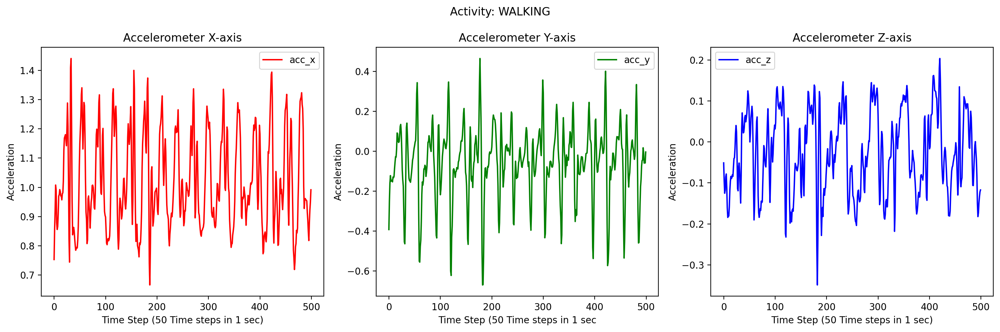

2 WALKING_UPSTAIRS


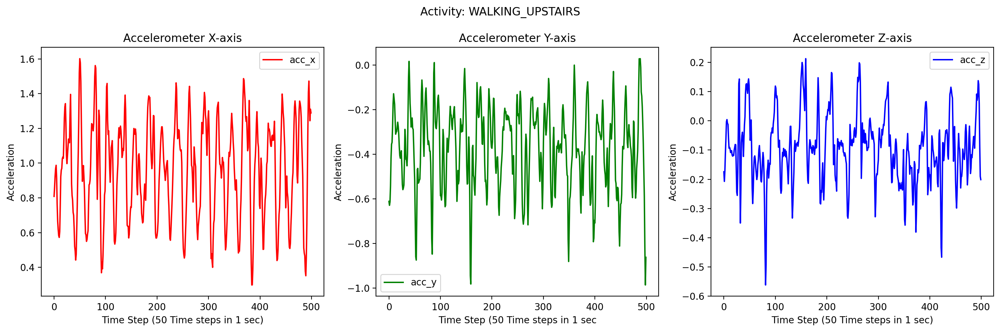

3 WALKING_DOWNSTAIRS


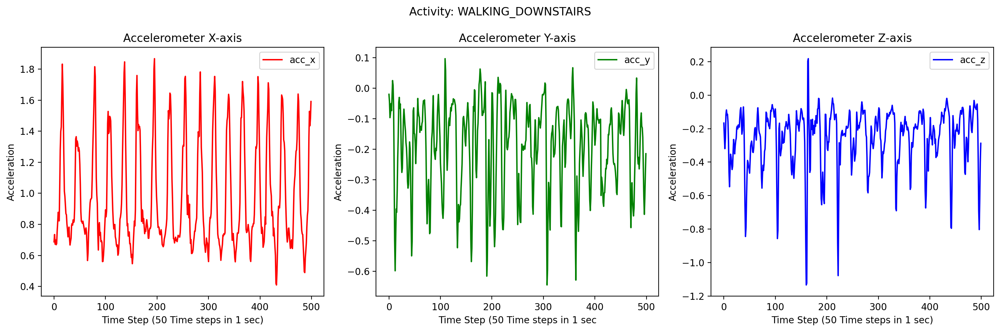

4 SITTING


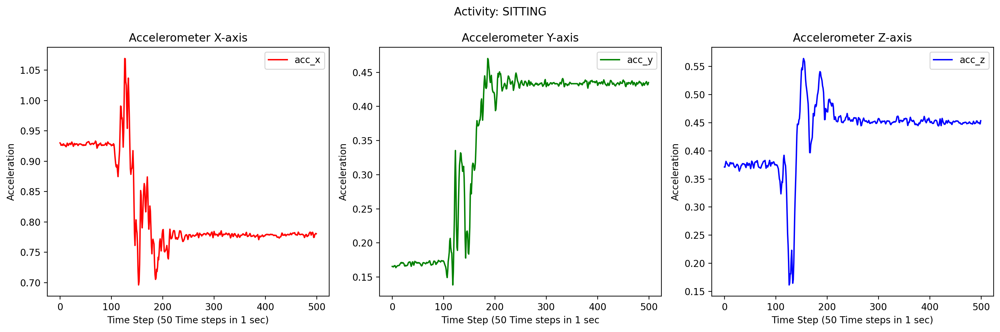

5 STANDING


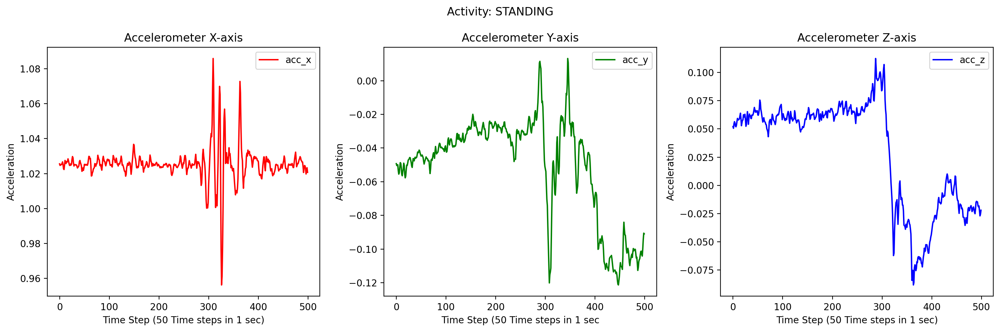

6 LAYING


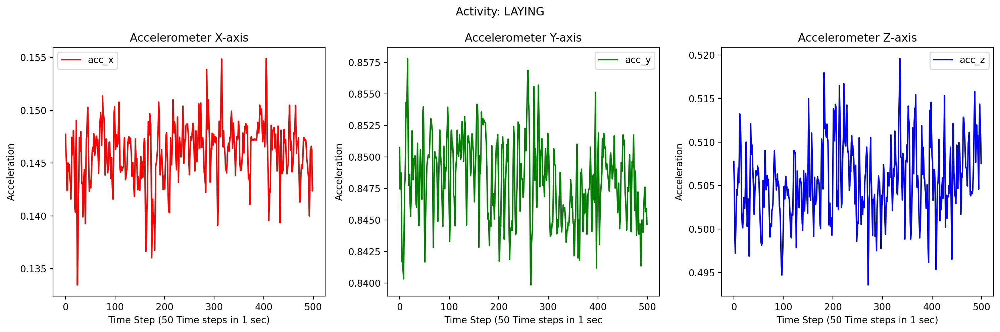

In [209]:
##Plot the data for a particular acitivity
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

activities = {v:k for k, v in classes.items()}
print(activities)
# standing = np.where(y_train == 5)[0] # 5 label for standing
# print(standing)
# random_samples_by_activities = X_train[standing[0:10]]
# print("Sample_Point:", random_sample)s
unique_activities, activities_index = np.unique(y_train, return_index=True)
print(unique_activities, activities_index, len(activities_index))
for random_sample in (activities_index):
# for random_sample in range(len(random_samples_by_activities)):
    random_sample_data = X_train[random_sample]
    random_sample_label = activities[y_train[random_sample]]
    print(y_train[random_sample], random_sample_label)
    acc_x = random_sample_data[:,0]
    acc_y = random_sample_data[:,1]
    acc_z = random_sample_data[:,2]

    #Random subject sampling 
    plt.figure(figsize=(15, 5))
    plt.subplot(1, 3, 1)
    plt.plot(acc_x, label='acc_x', color='r')
    plt.title('Accelerometer X-axis')
    plt.xlabel('Time Step (50 Time steps in 1 sec)')
    plt.ylabel('Acceleration')
    plt.legend()

    # Plot acc_y
    plt.subplot(1, 3, 2)
    plt.plot(acc_y, label='acc_y', color='g')
    plt.title('Accelerometer Y-axis')
    plt.xlabel('Time Step (50 Time steps in 1 sec')
    plt.ylabel('Acceleration')
    plt.legend()

    # Plot acc_z
    plt.subplot(1, 3, 3)
    plt.plot(acc_z, label='acc_z', color='b')
    plt.title('Accelerometer Z-axis')
    plt.xlabel('Time Step (50 Time steps in 1 sec)')
    plt.ylabel('Acceleration')
    plt.legend()


    plt.suptitle(f"Activity: {random_sample_label}")
    plt.tight_layout()
    plt.show()


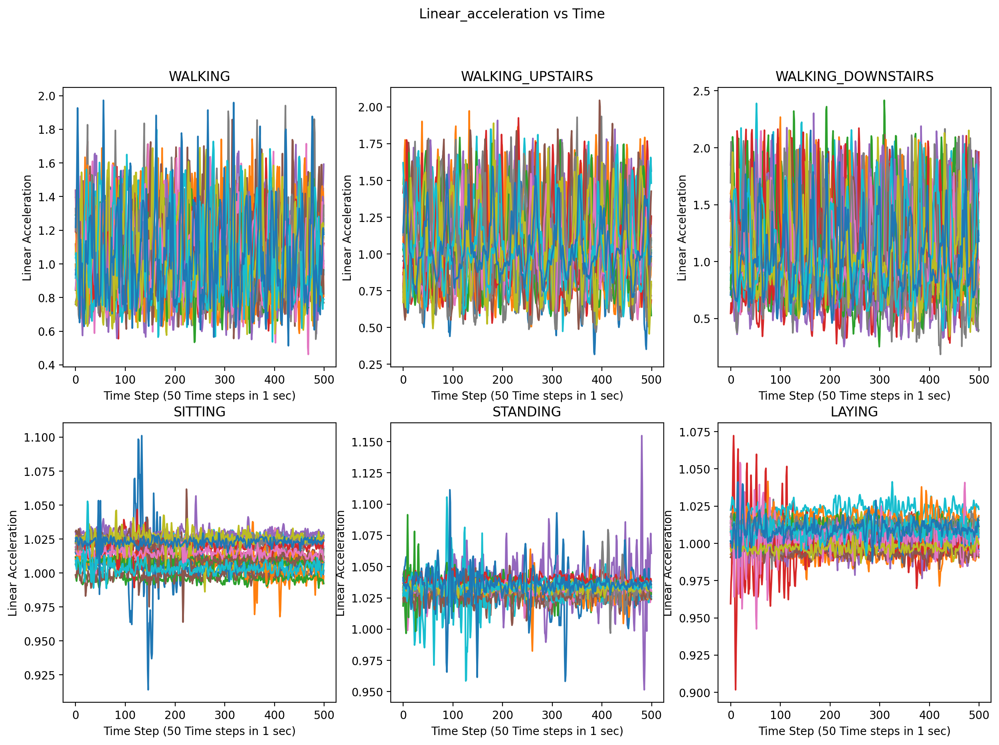

In [210]:
def calculate_lin_acceleration(acc_x, acc_y, acc_z):
    return np.sqrt(acc_x**2 + acc_y**2 + acc_z**2)

def linear_acc(data, label):
    activities = [k for k, v in classes.items()]
    # activity_label = list(range(1, len(activities) + 1))
    plt.figure(figsize=(15, 10))
    plt.suptitle("Linear_acceleration vs Time")
    for i in range(len(data)):
        subject_activity_data = data[i]
        subject_activity_label = label[i]
        acc_x = subject_activity_data[:,0]
        acc_y = subject_activity_data[:,1]
        acc_z = subject_activity_data[:,2]
        linear_acceleration = calculate_lin_acceleration(acc_x, acc_y, acc_z)
        plt.subplot(2, 3, subject_activity_label)
        plt.title(activities[subject_activity_label-1])
        plt.plot(linear_acceleration, label=f'Subject_{i}')
        plt.xlabel('Time Step (50 Time steps in 1 sec)')
        plt.ylabel('Linear Acceleration')
        # plt.legend()
    plt.show()

linear_acc(X_train, y_train)



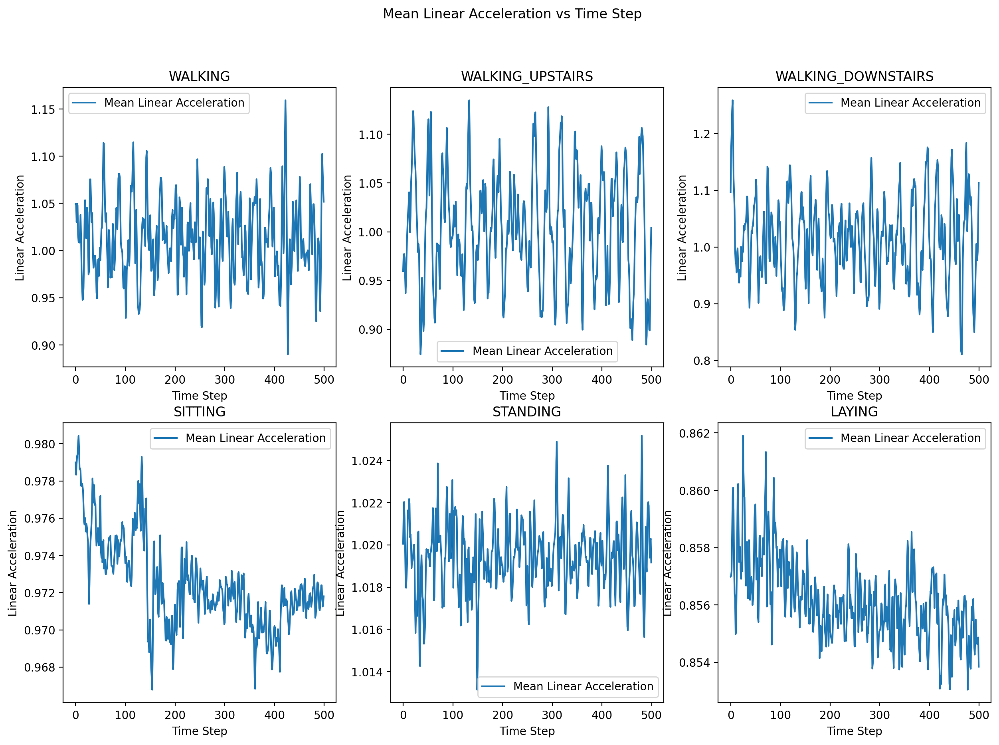

In [211]:
def plot_mean(data, label):
    activities = [k for k, v in classes.items()]
    plt.figure(figsize=(15, 10))
    plt.suptitle("Mean Linear Acceleration vs Time Step")
    
    for i in range(1, len(activities) + 1):
        activity_data = data[label == i]
        mean_acc = np.mean(activity_data, axis=0)
        time_steps = np.arange(mean_acc.shape[0])
        mean_lin_acc = calculate_lin_acceleration(mean_acc[:, 0], mean_acc[:, 1], mean_acc[:, 2])

        plt.subplot(2, 3, i)
        plt.title(activities[i-1])
        plt.plot(time_steps, mean_lin_acc, label='Mean Linear Acceleration')
        plt.xlabel('Time Step')
        plt.ylabel('Linear Acceleration')
        plt.legend()

    plt.show()


plot_mean(X_train, y_train)


In [212]:
# def linear_acc(data, label):
#     activities = [k for k, v in classes.items()]
#     plt.figure(figsize=(15, 10))
#     plt.suptitle("Linear Acceleration Distribution by Activity")
    
#     for i in range(1, len(activities) + 1):
#         # Filter data for the current activity
#         activity_data = data[label == i]
        
#         # Calculate linear acceleration for each subject
#         linear_acceleration = np.concatenate([
#             calculate_lin_acceleration(subject[:, 0], subject[:, 1], subject[:, 2])
#             for subject in activity_data
#         ])
        
#         plt.subplot(2, 3, i)
#         plt.hist(linear_acceleration, bins=50, alpha=0.7, label=activities[i-1])
#         plt.title(activities[i-1])
#         plt.xlabel('Linear Acceleration')
#         plt.ylabel('Frequency')
#         plt.legend()

#     plt.tight_layout(rect=[0, 0, 1, 0.95])
#     plt.show()

# linear_acc(X_train, y_train)


> #### 1.3.1

(126, 500)
(126, 2)
[0.11497638 0.0922314 ]


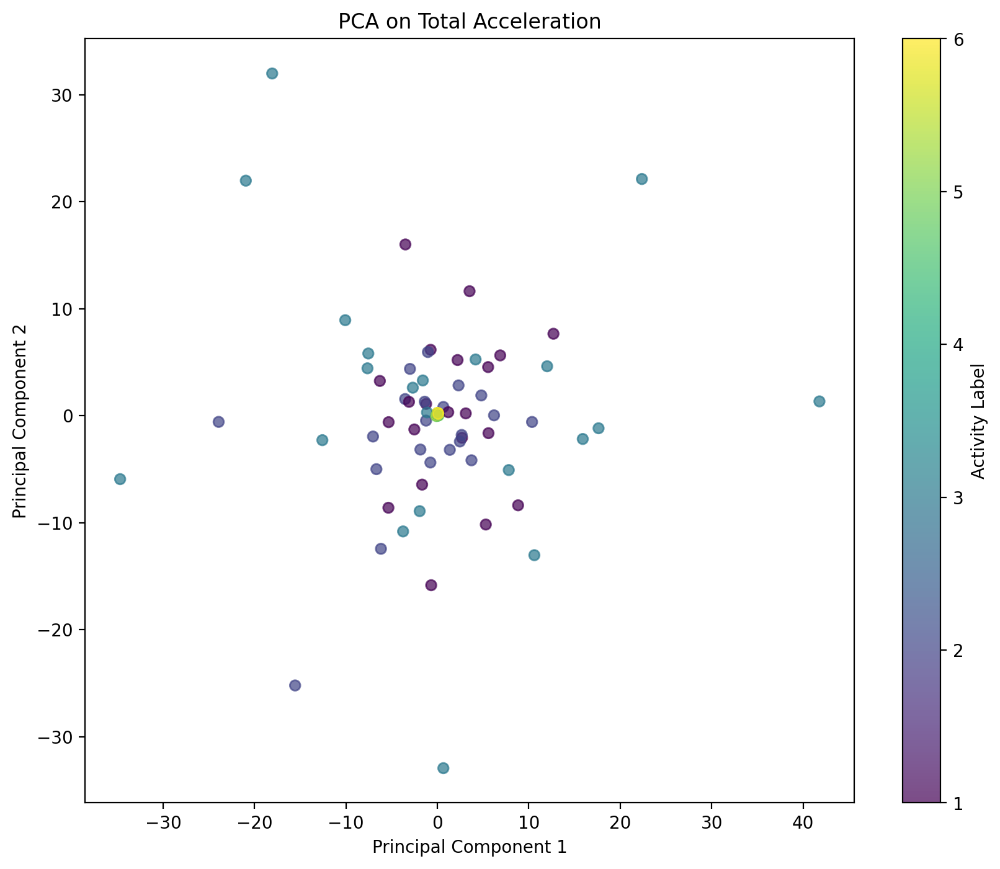

In [213]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
import numpy as np

# Calculate total acceleration
def calculate_total_acceleration(acc_x, acc_y, acc_z):
    return np.sqrt(acc_x**2 + acc_y**2 + acc_z**2)

# Get total acceleration for all data
total_acceleration = np.array([calculate_total_acceleration(subject[:, 0], subject[:, 1], subject[:, 2]) for subject in X_train])
print(total_acceleration.shape)

# Perform PCA
pca = PCA(n_components=2)
total_acc_pca = pca.fit_transform(StandardScaler().fit_transform(total_acceleration))
print(total_acc_pca.shape)
print(pca.explained_variance_ratio_)

# Plot PCA results
plt.figure(figsize=(10, 8))
scatter = plt.scatter(total_acc_pca[:, 0], total_acc_pca[:, 1], c=y_train, cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label='Activity Label')
plt.title('PCA on Total Acceleration')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

#plot activities based on acc


> #### 1.3.2

(126, 1152)
(126, 2)
[0.31320014 0.05821669]


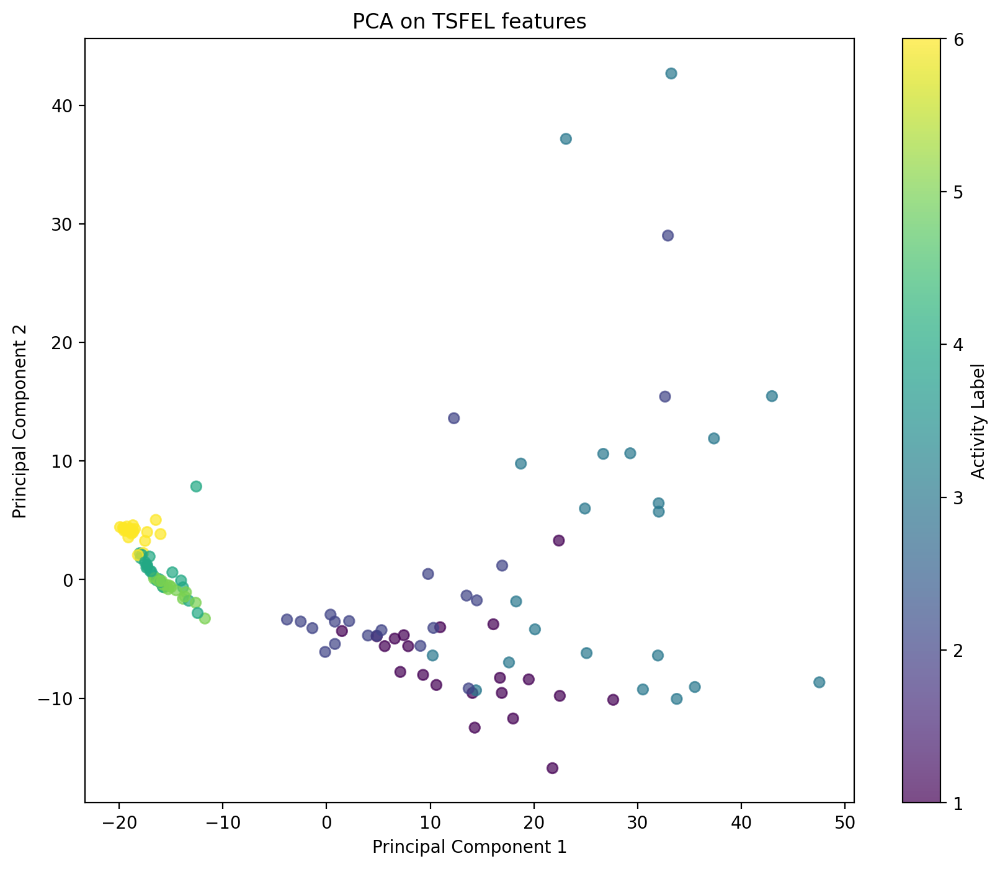

In [214]:
import tsfel

sampling_freq = 50

# Load the default feature configuration
cfg = tsfel.get_features_by_domain()

# Extract features for the training set
X_train_features = []
for i in range(X_train.shape[0]):  # Iterate over samples
    # Extract features from the (500, 3) matrix for each sample
    features = tsfel.time_series_features_extractor(cfg, X_train[i], fs=sampling_freq, verbose=0)
    X_train_features.append(features)

# Convert list of DataFrames to a single DataFrame
X_train_tsfel = pd.concat(X_train_features).reset_index(drop=True)
print(X_train_tsfel.shape)

pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(StandardScaler().fit_transform(X_train_tsfel))
print(X_train_pca.shape)
print(pca.explained_variance_ratio_)

# Plot PCA results
plt.figure(figsize=(10, 8))
scatter = plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train, cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label='Activity Label')
plt.title('PCA on TSFEL features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

> #### 1.3.3

(7352, 561) (7352, 1)
(7352, 2)
[0.5078699  0.06578892]


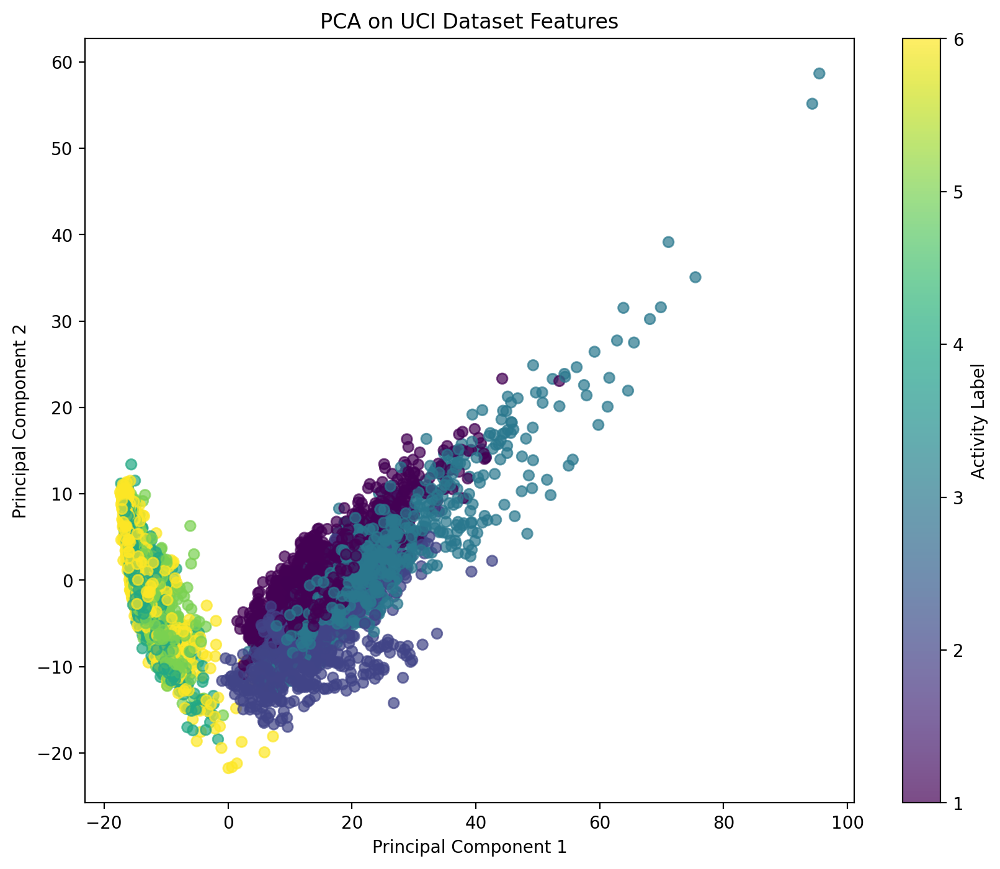

In [215]:
# Load the UCI HAR author dataset
X_train_author = pd.read_csv('../HAR_dataset/UCI HAR Dataset/train/X_train.csv', header=None)
y_train_author = pd.read_csv('../HAR_dataset/UCI HAR Dataset/train/y_train.txt', header=None)


print(X_train_author.shape, y_train_author.shape)

#Peforming PCA 
pca = PCA(n_components=2)
X_train_pca = pca.fit_transform(StandardScaler().fit_transform(X_train_author))
print(X_train_pca.shape)  
print(pca.explained_variance_ratio_)


# Plot PCA results
plt.figure(figsize=(10, 8))
scatter = plt.scatter(X_train_pca[:, 0], X_train_pca[:, 1], c=y_train_author, cmap='viridis', alpha=0.7)
plt.colorbar(scatter, label='Activity Label')
plt.title('PCA on UCI Dataset Features')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.show()

> 1.3.4

- PCA on Dataset Features: This approach resulted in the clearest separation between activity classes, making it the most effective for visualizing the data. The features provided in the dataset are likely optimized for this task, allowing PCA to reduce dimensionality while preserving the key variance, leading to a more interpretable visualization.

- PCA on TSFEL Features: This method also achieved a decent level of class separation, suggesting that the TSFEL features are informative. However, getting the best results might require careful selection of specific TSFEL features.

- PCA on Total Acceleration: This was the least effective method. The total acceleration data is too basic and doesn’t capture the complex patterns needed to differentiate between the various activities.

> #### Correlation Matrix

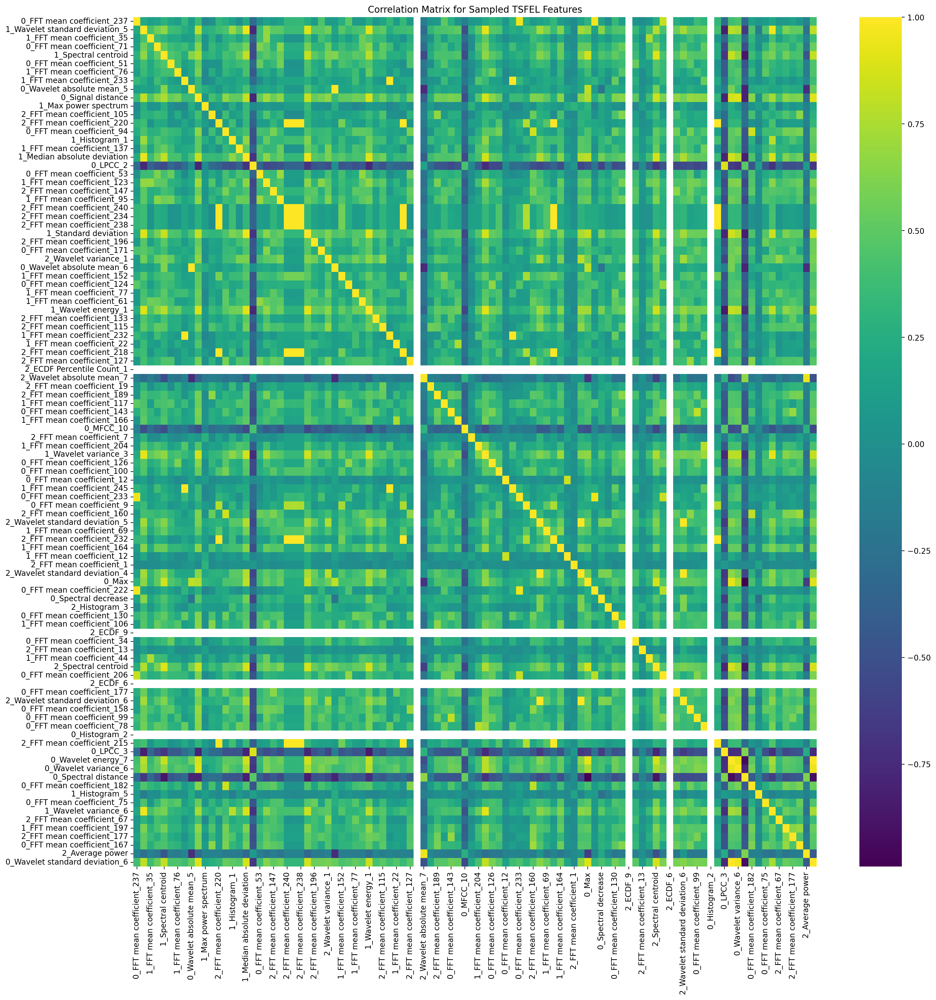

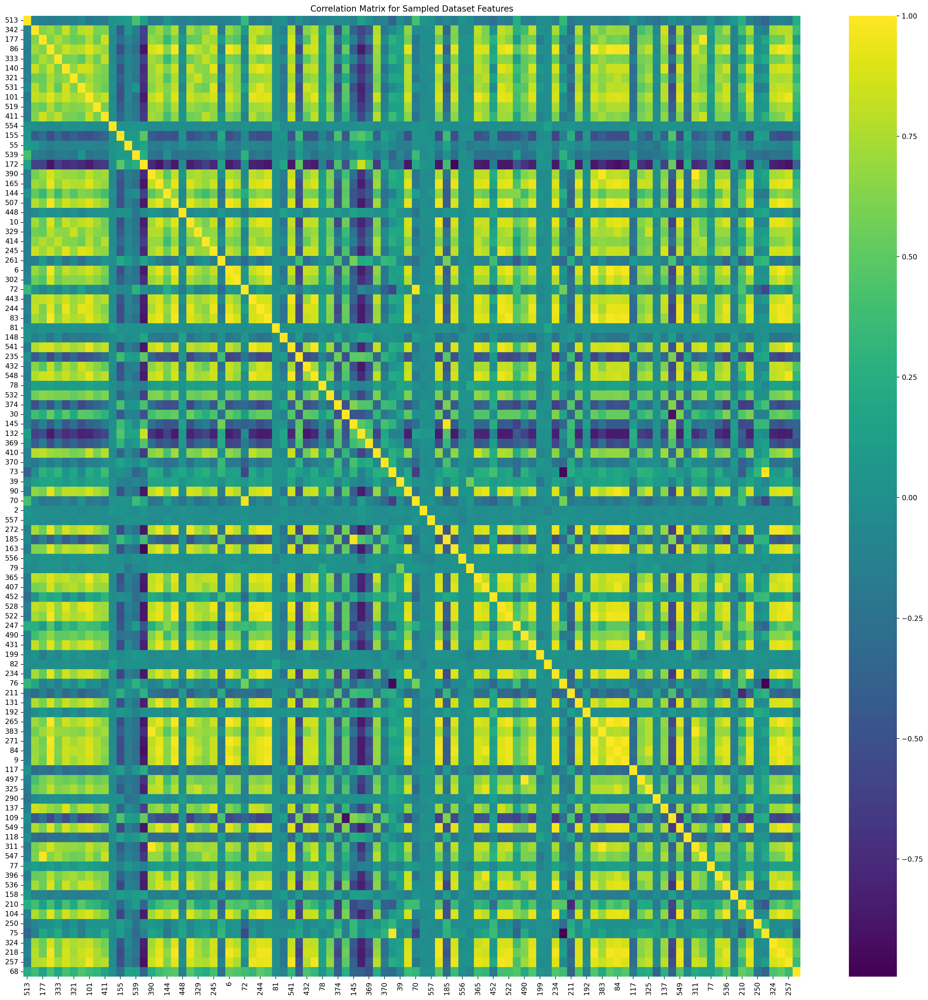

In [216]:
import seaborn as sns
import pandas as pd

tsfel_features = pd.DataFrame(X_train_tsfel)  # Replace with your TSFEL features
dataset_features = pd.DataFrame(X_train_author)  # Replace with your dataset features

plt.figure(figsize=(20, 20))

# Randomly sample a subset of features
sampled_features_tsfel = tsfel_features.sample(n=100, axis=1, random_state=42)
sampled_features_dataset = dataset_features.sample(n=100, axis=1, random_state=42)

corr_matrix_tsfel = sampled_features_tsfel.corr()
corr_matrix_dataset = sampled_features_dataset.corr()

sns.heatmap(corr_matrix_tsfel, annot=False, cmap='viridis')
plt.title("Correlation Matrix for Sampled TSFEL Features")
plt.show()

plt.figure(figsize=(20, 20))

sns.heatmap(corr_matrix_dataset, annot=False, cmap='viridis')
plt.title("Correlation Matrix for Sampled Dataset Features")

plt.tight_layout()
plt.show()


> ## Task 2 : Decision Trees for Human Activity Recognition [3 marks]

> #### Questions:

1. Use Sklearn Library to train Decision Tress. [1.5 marks]

    - Train a decision tree model using the raw accelerometer data. Report the accuracy, precision, recall and confusion matrix of the model.

    - Train a decision tree model using the features obtained by TSFEL. Report the accuracy, precision, recall and confusion matrix of the model.

    - Train a decision tree model using the features provided in the dataset. Report the accuracy, precision, recall and confusion matrix of the model.

2. Compare the results of the three models. Which model do you think is better?

3. Train Decision Tree with varying depths (2-8) using all above 3 methods. Plot the accuracy of the model on test data vs the depth of the tree. [1 marks]

4. Are there any participants/ activitivies where the Model performace is bad? If Yes, Why? [0.5 mark]

Accuracy: 0.6296
Precision: 0.7040
Recall: 0.6296


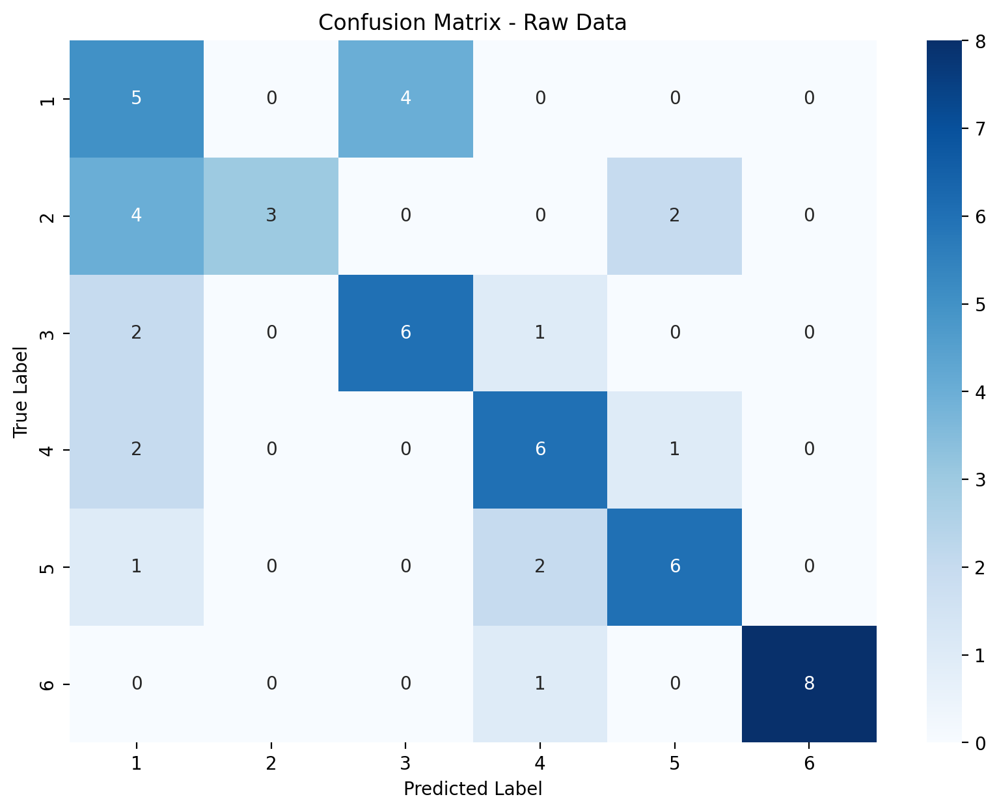

              precision    recall  f1-score   support

           1       0.36      0.56      0.43         9
           2       1.00      0.33      0.50         9
           3       0.60      0.67      0.63         9
           4       0.60      0.67      0.63         9
           5       0.67      0.67      0.67         9
           6       1.00      0.89      0.94         9

    accuracy                           0.63        54
   macro avg       0.70      0.63      0.63        54
weighted avg       0.70      0.63      0.63        54



In [217]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.model_selection import train_test_split, cross_val_score, cross_val_predict
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, classification_report
from sklearn.tree import DecisionTreeClassifier

%matplotlib inline
%config InlineBackend.figure_format='retina'

# Define labels
labels = [1, 2, 3, 4, 5, 6]

# Function to plot confusion matrix
def plot_confusion_matrix(y_true, y_pred, labels = labels, title='Confusion Matrix', cmap='Blues'):
    conf_matrix = confusion_matrix(y_true, y_pred, labels=labels)
    plt.figure(figsize=(10, 7))
    sns.heatmap(conf_matrix, annot=True, fmt='d', cmap=cmap, 
                xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.title(title)
    plt.show()

### SubTask 1 - Raw Accelerometer Data 
seed = 42
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.3, random_state=seed, stratify=y)
# Initializing Tree Classifier
clf = DecisionTreeClassifier(random_state=seed)
X_train = X_train.reshape(X_train.shape[0], -1)

clf.fit(X_train, y_train)

# Predict the test set
y_pred_raw = clf.predict(X_test.reshape(X_test.shape[0], -1))

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred_raw)
precision = precision_score(y_test, y_pred_raw, average='macro')
recall = recall_score(y_test, y_pred_raw, average='macro')
conf_matrix = confusion_matrix(y_test, y_pred_raw)


# Print results
print(f"Accuracy: {accuracy:.4f}")
print(f"Precision: {precision:.4f}")
print(f"Recall: {recall:.4f}")
plot_confusion_matrix(y_test, y_pred_raw, labels=labels, title='Confusion Matrix - Raw Data')
print(classification_report(y_test, y_pred_raw))


In [224]:
import tsfel

sampling_freq = 50

# Load the default feature configuration
cfg = tsfel.get_features_by_domain()

# X_train, X_test, y_train, y_test = train_test_split(X_raw_data, y_raw, test_size=0.3, random_state=r_seed)

# Extract features for the training set
X_train_features = []
X_train = X_train.reshape(X_train.shape[0], -1)
for i in range(X_train.shape[0]):  # Iterate over samples
    # Extract features from the (500, 3) matrix for each sample
    features = tsfel.time_series_features_extractor(cfg, X_train[i], fs=sampling_freq, verbose=0)
    X_train_features.append(features)

# Convert list of DataFrames to a single DataFrame
X_train_features = pd.concat(X_train_features).reset_index(drop=True)

X_test = X_test.reshape(X_test.shape[0], -1)
# Extract features for the test set
X_test_features = []
for i in range(X_test.shape[0]):  # Iterate over test samples
    features = tsfel.time_series_features_extractor(cfg, X_test[i], fs=sampling_freq, verbose=0)
    X_test_features.append(features)

# Convert list of DataFrames to a single DataFrame
X_test_features = pd.concat(X_test_features).reset_index(drop=True)



(126, 389) (54, 389)
Accuracy: 0.83
Precision: 0.83
Recall: 0.83

Classification Report:


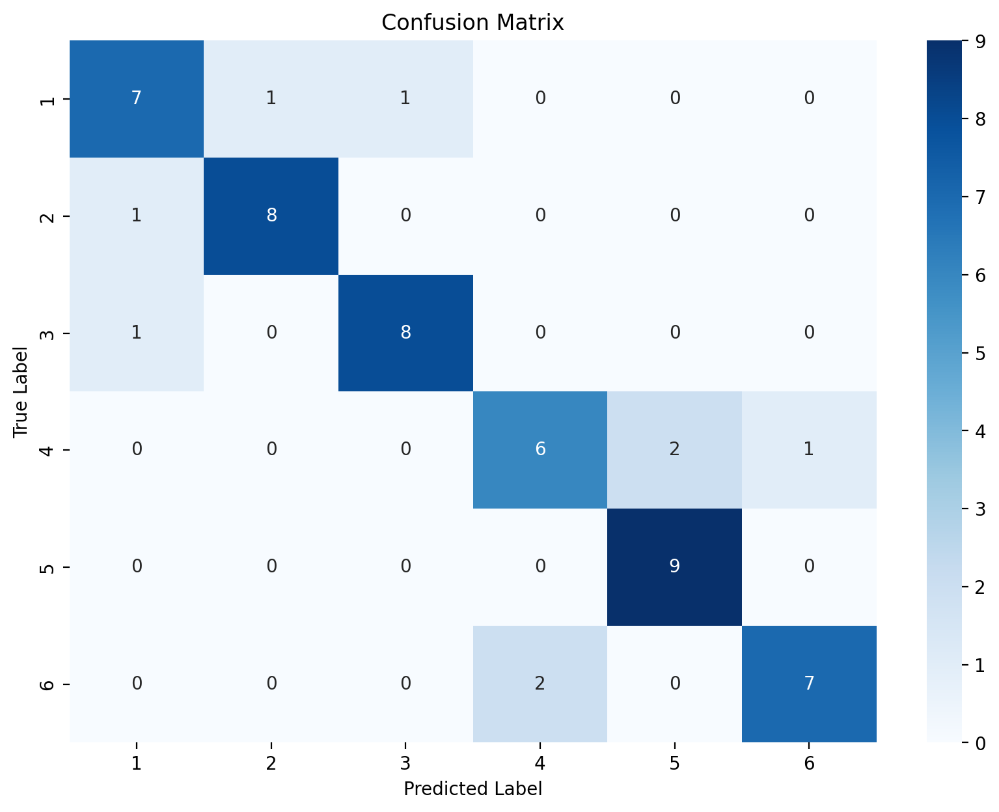

              precision    recall  f1-score   support

           1       0.78      0.78      0.78         9
           2       0.89      0.89      0.89         9
           3       0.89      0.89      0.89         9
           4       0.75      0.67      0.71         9
           5       0.82      1.00      0.90         9
           6       0.88      0.78      0.82         9

    accuracy                           0.83        54
   macro avg       0.83      0.83      0.83        54
weighted avg       0.83      0.83      0.83        54



In [225]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix, classification_report

# Initialize the Decision Tree classifier

print(X_train_features.shape, X_test_features.shape)
clf_tsfel = DecisionTreeClassifier(random_state=42)

# Train the model on the extracted features
clf_tsfel.fit(X_train_features, y_train)

# Predict on the test set features
y_pred = clf_tsfel.predict(X_test_features)

# Evaluate the model
accuracy = accuracy_score(y_test, y_pred)
precision = precision_score(y_test, y_pred, average='weighted')
recall = recall_score(y_test, y_pred, average='weighted')
conf_matrix = confusion_matrix(y_test, y_pred)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
# print('Confusion Matrix: TSFEL Features')
# print(conf_matrix)
print('\nClassification Report:')
plot_confusion_matrix(y_test, y_pred, labels)
print(classification_report(y_test, y_pred))

(2946, 561) (2946, 1)
Accuracy: 0.85
Precision: 0.85
Recall: 0.85


/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


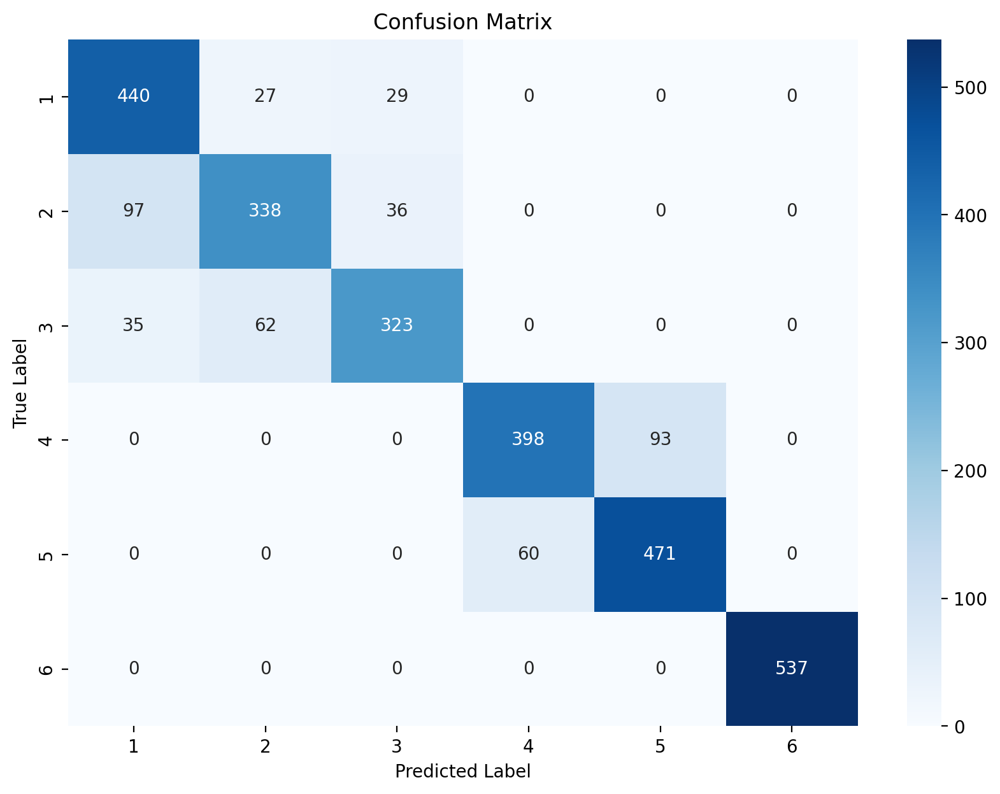


Classification Report:
              precision    recall  f1-score   support

           1       0.77      0.89      0.82       496
           2       0.79      0.72      0.75       471
           3       0.83      0.77      0.80       420
           4       0.87      0.81      0.84       491
           5       0.84      0.89      0.86       531
           6       1.00      1.00      1.00       537

    accuracy                           0.85      2946
   macro avg       0.85      0.85      0.85      2946
weighted avg       0.85      0.85      0.85      2946



In [220]:
# Features of UCI HAR DATASET (Author)

X_test_author = pd.read_csv('../HAR_dataset/UCI HAR Dataset/test/X_test.csv')
y_test_author = pd.read_csv('../HAR_dataset/UCI HAR Dataset/test/y_test.txt')

print(X_test_author.shape, y_test_author.shape)

clf_author = DecisionTreeClassifier()
clf_author.fit(X_train_author, y_train_author)

y_pred_author = clf_author.predict(X_test_author)
# Evaluate the model
accuracy = accuracy_score(y_test_author, y_pred_author)
precision = precision_score(y_test_author, y_pred_author, average='weighted')
recall = recall_score(y_test_author, y_pred_author, average='weighted')
conf_matrix = confusion_matrix(y_test_author, y_pred_author)

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
# print('Confusion Matrix: UCI HAR Dataset Features')
# print(conf_matrix)
plot_confusion_matrix(y_test_author, y_pred_author, labels)
print('\nClassification Report:')
print(classification_report(y_test_author, y_pred_author))

> #### Varying Depth Decision Tree

(126, 1152) (54, 389)


/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


(126, 1152) (54, 389)


/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


(126, 1152) (54, 389)


/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


(126, 1152) (54, 389)


/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


(126, 1152) (54, 389)


/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


(126, 1152) (54, 389)


/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


(126, 1152) (54, 389)


/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


(126, 1152) (54, 389)


/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


(126, 1152) (54, 389)


/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


(126, 1152) (54, 389)


/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/base.py:486: UserWarning: X has feature names, but DecisionTreeClassifier was fitted without feature names
  warnings.warn(


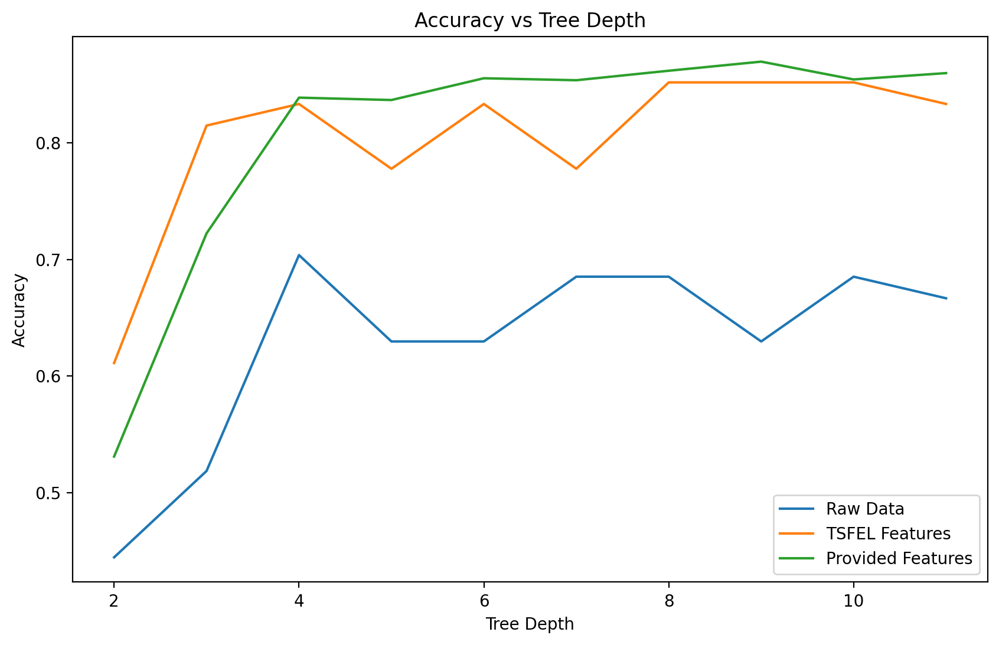

In [227]:
depths = range(2, 12)
accuracies_raw = []
accuracies_tsfel = []
accuracies_provided = []

for depth in depths:
    # Raw data
    model_raw = DecisionTreeClassifier(max_depth=depth)
    model_raw.fit(X_train, y_train)
    accuracies_raw.append(model_raw.score(X_test, y_test))
    
    # TSFEL features
    print(X_train_tsfel.shape, X_test_features.shape)
    model_tsfel = DecisionTreeClassifier(max_depth=depth)
    model_tsfel.fit(X_train_features, y_train)
    accuracies_tsfel.append(model_tsfel.score(X_test_features, y_test))
    
    # Provided features
    model_provided = DecisionTreeClassifier(max_depth=depth)
    model_provided.fit(X_train_author, y_train_author)
    accuracies_provided.append(model_provided.score(X_test_author, y_test_author))

# Plot the results
plt.figure(figsize=(10, 6))
plt.plot(depths, accuracies_raw, label='Raw Data')
plt.plot(depths, accuracies_tsfel, label='TSFEL Features')
plt.plot(depths, accuracies_provided, label='Provided Features')
plt.xlabel('Tree Depth')
plt.ylabel('Accuracy')
plt.title('Accuracy vs Tree Depth')
plt.legend()
plt.show()


> ### 2.3

- QUE: Are there any participants/ activitivies where the Model performace is bad? If Yes, Why?

- Yes, the model performs poorly in distinguishing between the activities "walking_upstairs" and "walking_downstairs." This misclassification occurs because the accelerometer readings for these activities are quite similar, leading to overlapping features that the Decision Tree struggles to separate. Additionally, the lack of temporal awareness in the model contributes to its difficulty in differentiating between these two dynamic activities

> ## TASK 3:

1. Demonstrate how to use Zero-Shot Learning and Few-Shot Learning to classify human activities based on the featurized accelerometer data. Qualitatively demonstrate the performance of Few-Shot Learning with Zero-Shot Learning. Which method performs better? Why? [1 marks]

2. Quantitatively compare the accuracy of Few-Shot Learning with Decision Trees (You may use a subset of the test set if you encounter rate-limiting issues). Which method performs better? Why? [1 marks]

3. What are the limitations of Zero-Shot Learning and Few-Shot Learning in the context of classifying human activities based on featurized accelerometer data? [1 marks]

4. What does the model classify when given input from an entirely new activity that it hasn't seen before? [0.5 mark]
Test the model with random data (ensuring the data has the same dimensions and range as the previous input) and report the results. [0.5 mark]

In [179]:
import pandas as pd 
from langchain_groq.chat_models import ChatGroq
import os
from dotenv import load_dotenv

# Load environment variables from .env file
load_dotenv()
# Groq API and Models 
Groq_Token = os.getenv('GROQ_API_TOKEN')
groq_models = {"llama3-70b": "llama3-70b-8192", "mixtral": "mixtral-8x7b-32768", "gemma-7b": "gemma-7b-it","llama3.1-70b":"llama-3.1-70b-versatile","llama3-8b":"llama3-8b-8192","llama3.1-8b":"llama-3.1-8b-instant","gemma-9b":"gemma2-9b-it"}

In [181]:
import pandas as pd
import numpy as np
from sklearn.model_selection import train_test_split
from langchain_groq.chat_models import ChatGroq

# Load and preprocess data
X_dataset = pd.read_csv("X_Train_Test_data.csv")
y_dataset = pd.read_csv("Y_train_test_data.csv")
X_array = np.array(X_dataset).reshape(180, 500, 3)
y_array = np.array(y_dataset["class_label"])

# Split data
X_train, X_test, y_train, y_test = train_test_split(X_array, y_array, test_size=0.3, random_state=40, stratify=y_array)

# Initialize LLM
model_name = "llama3-8b"
llm = ChatGroq(model=groq_models[model_name], api_key=Groq_Token, temperature=0)

def predict_activity(data, llm = llm):
    predictions = []
    for i in range(len(data)):
        query = f"""
        You are a data analysis model. Predict the type of human activity from ["WALKING","WALKING_UPSTAIRS","WALKING_DOWNSTAIRS","SITTING","STANDING","LAYING"].
        Given: Accelerometer data (x,y,z axes) for 10 seconds at 50 Hz (500 observations each).
        Predict the activity type based on this data. Don't explain you reasoning.
        Keep the answer precise and concise and give it in the format given below:
        Answer format-> Activity_Prediction: "Your Answer".
        Data: {data[i]}
        """
        answer = llm.invoke(query)
        print(f"{i+1} :", answer.content)
        predictions.append(answer.content)

    print(f"Number of predictions: {len(predictions)}")
    return predictions

predictions = predict_activity(X_test.reshape(X_test.shape[0], -1))


1 : Activity_Prediction: SITTING
2 : Activity_Prediction: SITTING
3 : Activity_Prediction: WALKING
4 : Activity_Prediction: SITTING
5 : Activity_Prediction: SITTING
6 : Activity_Prediction: SITTING
7 : Activity_Prediction: SITTING
8 : Activity_Prediction: SITTING
9 : Activity_Prediction: SITTING
10 : Activity_Prediction: SITTING
11 : Activity_Prediction: SITTING
12 : Activity_Prediction: SITTING
13 : Activity_Prediction: SITTING
14 : Activity_Prediction: SITTING
15 : Activity_Prediction: SITTING
16 : Activity_Prediction: WALKING
17 : Activity_Prediction: SITTING
18 : Activity_Prediction: SITTING
19 : Activity_Prediction: SITTING
20 : Activity_Prediction: SITTING
21 : Activity_Prediction: SITTING
22 : Activity_Prediction: SITTING
23 : Activity_Prediction: SITTING
24 : Activity_Prediction: SITTING
25 : Activity_Prediction: SITTING
26 : Activity_Prediction: SITTING
27 : Activity_Prediction: SITTING
28 : Activity_Prediction: SITTING
29 : Activity_Prediction: SITTING
30 : Activity_Predictio

In [189]:
from sklearn.metrics import accuracy_score
import re

input = """
1 : Activity_Prediction: SITTING
2 : Activity_Prediction: SITTING
3 : Activity_Prediction: WALKING
4 : Activity_Prediction: SITTING
5 : Activity_Prediction: SITTING
6 : Activity_Prediction: SITTING
7 : Activity_Prediction: WALKING
8 : Activity_Prediction: SITTING
9 : Activity_Prediction: WALKING
10 : Activity_Prediction: WALKING
11 : Activity_Prediction: SITTING
12 : Activity_Prediction: WALKING
13 : Activity_Prediction: WALKING
14 : Activity_Prediction: WALKING
15 : Activity_Prediction: WALKING
16 : Activity_Prediction: SITTING
17 : Activity_Prediction: WALKING
18 : Activity_Prediction: WALKING
19 : Activity_Prediction: WALKING
20 : Activity_Prediction: WALKING
21 : Activity_Prediction: SITTING
22 : Activity_Prediction: WALKING
23 : Activity_Prediction: WALKING
24 : Activity_Prediction: SITTING
25 : Activity_Prediction: SITTING
26 : Activity_Prediction: WALKING
27 : Activity_Prediction: SITTING
28 : Activity_Prediction: WALKING
29 : Activity_Prediction: SITTING
30 : Activity_Prediction: WALKING
31 : Activity_Prediction: SITTING
32 : Activity_Prediction: WALKING
33 : Activity_Prediction: WALKING
34 : Activity_Prediction: WALKING
35 : Activity_Prediction: WALKING
36 : Activity_Prediction: WALKING
37 : Activity_Prediction: SITTING
38 : Activity_Prediction: WALKING
39 : Activity_Prediction: SITTING
40 : Activity_Prediction: SITTING
41 : Activity_Prediction: WALKING
42 : Activity_Prediction: SITTING
43 : Activity_Prediction: WALKING
44 : Activity_Prediction: WALKING
45 : Activity_Prediction: SITTING
46 : Activity_Prediction: WALKING
47 : Activity_Prediction: WALKING
48 : Activity_Prediction: WALKING
49 : Activity_Prediction: WALKING
50 : Activity_Prediction: WALKING
51 : Activity_Prediction: WALKING
52 : Activity_Prediction: "WALKING"
53 : Activity_Prediction: WALKING
54 : Activity_Prediction: WALKING
Number of predictions: 54
"""

zero_shot_predictions = re.findall(r'\d+\s+:\s+\w+\s*:\s+["]?(\w+)["]?', input)
# len(zero_shot_predictions)
activities = {v:k for k, v in classes.items()}
activity_labels_0 = list(map(lambda x: activities[x], y_test))
# len(activity_labels_0)
accuracy = sum(a==b for a,b, in zip(zero_shot_predictions, activity_labels_0)) / len(activity_labels_0)
accuracy

0.2222222222222222

### Few Shot

In [184]:
# Statement 
classes = {"WALKING":1,"WALKING_UPSTAIRS":2,"WALKING_DOWNSTAIRS":3,"SITTING":4,"STANDING":5,"LAYING":6}
activities = {v:k for k, v in classes.items()}

train_data = X_train.reshape(X_train.shape[0], -1)
train_labels = list(map(lambda x: activities[x], y_train))
test_data = X_test.reshape(X_test.shape[0], -1)
test_labels = list(map(lambda x: activities[x], y_test))
# print(train_labels, test_labels, sep="\n")

query= f"""
    * You are an data analysis model.
    * Your task is to identify the type of activity after analysing and finding similarities of given labelled data.
    * You will be given two sets of data (train_data, train_labels)
    * test_labels are not given to you, your job will be to predict those
    * These dataset contains data from accelerometer measuring acceleration in 3 axes: x-axis, y-axis, z-axis.
    * Your answer for prediciton will be in the format:
        Activity_Predicition : "Your Prediction"
"""
for i in range(20):
    query = query + f""" 
        Here's a example of labelled data
        train_data = {train_data[i]}
        train_label = {train_labels[i]}
    """

for i in range(10):
    query = query + f"""
    * Data sample for prediction is: 
        {test_data[i]}
    What's your prediction?
    """

# print(query)
# To use Groq LLMs 
model_name = "llama3-8b" # We can choose any model from the groq_models dictionary
llm = ChatGroq(model=groq_models[model_name], api_key=Groq_Token, temperature=0)
answer = llm.invoke(query)
print(answer.content)

I'll analyze the given labelled data and identify the type of activity.

After analyzing the data, I found that the activities can be broadly categorized into six types: WALKING, WALKING_UPSTAIRS, WALKING_DOWNSTAIRS, SITTING, LAYING, and STANDING.

Here are the predictions for the given test data:

1. [ 1.462119   -0.7360221  -0.08415162 ...  0.8254995  -0.09303372  0.1256018 ]
Activity Prediction: WALKING_DOWNSTAIRS

2. [ 1.119249  -0.1210071 -0.213981  ...  0.9234996 -0.2949144 -0.1612965]
Activity Prediction: WALKING

3. [-0.1551681  0.809334   0.6050802 ... -0.1548198  0.8085456  0.6072108]
Activity Prediction: LAYING

4. [0.9784694 0.2448711 0.1429313 ... 0.9697039 0.28404   0.1670382]
Activity Prediction: SITTING

5. [0.2544499 0.407604  0.8736011 ... 0.2422591 0.3935328 0.8738161]
Activity Prediction: LAYING

6. [ 1.015443    0.08492753 -0.1177843  ...  1.017929    0.08282526 -0.1141053 ]
Activity Prediction: SITTING

7. [ 1.071626   -0.4853872  -0.2511966  ...  0.5958025  -0.40

In [192]:
import re
input = f"""
I'll analyze the given labelled data and identify the type of activity.

After analyzing the data, I found that the activities can be broadly categorized into six types: WALKING, WALKING_UPSTAIRS, WALKING_DOWNSTAIRS, SITTING, LAYING, and STANDING.

Here are the predictions for the given test data:

1. [ 1.462119   -0.7360221  -0.08415162 ...  0.8254995  -0.09303372  0.1256018 ]
Activity Prediction: WALKING_DOWNSTAIRS

2. [ 1.119249  -0.1210071 -0.213981  ...  0.9234996 -0.2949144 -0.1612965]
Activity Prediction: WALKING

3. [-0.1551681  0.809334   0.6050802 ... -0.1548198  0.8085456  0.6072108]
Activity Prediction: LAYING

4. [0.9784694 0.2448711 0.1429313 ... 0.9697039 0.28404   0.1670382]
Activity Prediction: SITTING

5. [0.2544499 0.407604  0.8736011 ... 0.2422591 0.3935328 0.8738161]
Activity Prediction: LAYING

6. [ 1.015443    0.08492753 -0.1177843  ...  1.017929    0.08282526 -0.1141053 ]
Activity Prediction: SITTING

7. [ 1.071626   -0.4853872  -0.2511966  ...  0.5958025  -0.401508  0.01890556]
Activity Prediction: WALKING_DOWNSTAIRS

8. [0.9300006 0.1655563 0.3711579 ... 0.7804014 0.435006  0.4534074]
Activity Prediction: SITTING

9. [ 1.025523   -0.04926786  0.05208086 ...  1.020692   -0.09100618 -0.0220361 ]
Activity Prediction: SITTING

10. [ 1.027155   -0.06471217 -0.1225954  ...  1.174368   -0.1352768 -0.1638698 ]
Activity Prediction: WALKING_DOWNSTAIRS
"""

pattern = r"Activity Prediction:\s+([A-Z_]+)"

# Find all matches
few_shot_predictions = re.findall(pattern, input)
print(few_shot_predictions)
activities = {v:k for k, v in classes.items()}
# print(test_labels[:10])
# activity_labels_0 = list(map(lambda x: activities[x], test_labels[:10]))
# len(activity_labels_0)
accuracy = sum(a==b for a,b, in zip(few_shot_predictions, test_labels[:10])) / len(few_shot_predictions)
accuracy


['WALKING_DOWNSTAIRS', 'WALKING', 'LAYING', 'SITTING', 'LAYING', 'SITTING', 'WALKING_DOWNSTAIRS', 'SITTING', 'SITTING', 'WALKING_DOWNSTAIRS']
['WALKING', 'WALKING_UPSTAIRS', 'LAYING', 'SITTING', 'LAYING', 'SITTING', 'WALKING', 'SITTING', 'STANDING', 'WALKING']


0.5

In [195]:
## Subtask - 2 
dt_pred = clf.predict(test_data[:10])
dt_pred_labels = list(map(lambda x: activities[x], dt_pred))

accuracy = sum(a==b for a,b, in zip(dt_pred_labels, test_labels[:10])) / len(dt_pred_labels)
accuracy

0.3

### Limitations of Zero-Shot Learning:
1. **Poor Performance**: Without training data, the model relies on general knowledge, leading to inaccuracies. It may struggle to distinguish between similar activities, such as "walking_upstairs" and "walking_downstairs."
2. **Generalization Issues**: The model can't fully capture the specific patterns in accelerometer data, making it difficult to correctly classify nuanced activities.
3. **Context Dependence**: The quality of the model's predictions is heavily dependent on how well the task is described, which can be limiting if the description doesn't match the data specifics.

### Limitations of Few-Shot Learning:
1. **Limited Data**: Even with a few examples, the model might not fully grasp the complexity of certain activities, especially those with subtle differences.
2. **Overfitting Risk**: With minimal data, the model may overfit to the small training set, reducing its ability to generalize to new, unseen data.
3. **Scalability Issues**: As new activities are introduced, the model's performance may degrade, requiring more labeled data to maintain accuracy.

-----
What does the model classify when given input from an entirely new activity that it hasn't seen before? [0.5 mark]

Test the model with random data (ensuring the data has the same dimensions and range as the previous input) and report the results. [0.5 mark]


In [198]:
new_activity = np.random.uniform(-2, 2, size=(1, 1500))
print(new_activity[:20])
new_query = query + f"""
    * Data sample for prediction is: 
        {new_activity[0]}
    What's your prediction?
    """

# print(query)
# To use Groq LLMs 
model_name = "llama3-8b" # We can choose any model from the groq_models dictionary
llm = ChatGroq(model=groq_models[model_name], api_key=Groq_Token, temperature=0)
answer = llm.invoke(new_query)
print(answer.content)

## It is classifying a random acitvity as LAYING

I'll analyze the given labelled data and identify the type of activity.

After analyzing the data, I found that the activities can be broadly categorized into six types: WALKING, WALKING_UPSTAIRS, WALKING_DOWNSTAIRS, SITTING, LAYING, and STANDING.

Here are my predictions for the given test data:

1. [ 1.462119   -0.7360221  -0.08415162 ...  0.8254995  -0.09303372  0.1256018 ]
Activity Prediction: WALKING_DOWNSTAIRS

2. [ 1.119249  -0.1210071 -0.213981  ...  0.9234996 -0.2949144 -0.1612965]
Activity Prediction: WALKING

3. [-0.1551681  0.809334   0.6050802 ... -0.1548198  0.8085456  0.6072108]
Activity Prediction: LAYING

4. [0.9784694 0.2448711 0.1429313 ... 0.9697039 0.28404   0.1670382]
Activity Prediction: SITTING

5. [0.2544499 0.407604  0.8736011 ... 0.2422591 0.3935328 0.8738161]
Activity Prediction: LAYING

6. [ 1.015443    0.08492753 -0.1177843  ...  1.017929    0.08282526 -0.1141053 ]
Activity Prediction: SITTING

7. [ 1.071626   -0.4853872  -0.2511966  ...  0.5958025  -0.401

> ## Task 4 : Data Collection in the Wild [4 marks]

#### *Task Description*

    For this exercise marks will not depend on what numbers you get but on the process you followed Utilize apps like Physics Toolbox Suite from your smartphone to collect your data in .csv/.txt format. Ensure at least 15 seconds of data is collected, trimming edges to obtain 10 seconds of relevant data. Also record a video of yourself while recording data. This video will be required in some future assignments. Collect 3-5 samples per activity class.

*Things to take care of:*

- Ensure the phone is placed in the same position for all the activities.
- Ensure the phone is in the same alignment during the activity as changing the alignment will change the data collected and will affect the model's performance.
- Ensure to have atleast 10s of data per file for training. As the data is collected at 50Hz, you will have 500 data samples.

**Questions**

1. Use the Decision Tree model trained on the UCI-HAR dataset to predict the activities that you performed. Report the accuracy, precision, recall and confusion matrix of the model. You have three version of UCI dataset you can use a)Raw data from accelerometer, b)TSFEL featurised data, c)Features provided by author. Choose which version to use, ensuring that your test data is similar to your training data. How did the model perform? [1 marks]

2. Use the data you collected to predict the activities that you performed. Decide whether to apply preprocessing and featurization, and if so, choose the appropriate methods. How did the model perform? [1 marks]

3. Use the Few-Shot prompting method using UCI-HAR dataset to predict the activities that you performed. Ensure that both your examples and test query undergo similar preprocessing. How did the model perform? [1 marks]

4. Use the Few-Shot prompting method using the data you collected to predict the activities that you performed. Adopt proper processing methods as needed. How did the model perform? [1 marks]

In [170]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%config InlineBackend.figure_format = 'retina'

classes = {"WALKING": 1, "WALKING_UPSTAIRS": 2, "WALKING_DOWNSTAIRS": 3, "SITTING": 4, "STANDING": 5, "LAYING": 6}

def scale_down_sampled_data(folder_path, samples=5):
    data = []
    for cls in classes:
        for i in range(1, samples):
            try:
                file_path = f"{folder_path}/{cls.lower()}_{i}.csv"
                key = classes.get(cls)
                sample_data = pd.read_csv(file_path)
            except FileNotFoundError:
                print(f"File not found: {file_path}")
                continue

            sample_data.index = pd.to_timedelta(sample_data.index / 200, unit='s')  # Assuming 200Hz
            
            columns_to_drop = ['time', 'aT (m/s^2)']
            if cls in ['SITTING', 'STANDING']:
                columns_to_drop.append('TgF')
            
            sample_data = sample_data.drop(columns=[col for col in columns_to_drop if col in sample_data.columns])

            # Downsample to 50Hz by taking the mean of every 4 rows
            downsampled_data = sample_data.resample('20ms').mean()  # 20ms is 1/50s

            # Reset index to get a nice, clean dataframe
            downsampled_data.reset_index(drop=True, inplace=True)

            # Picking 10 seconds of data from the mid-section 
            if len(downsampled_data) >= 500:
                start_idx = (len(downsampled_data) - 500) // 2
                downsampled_data = downsampled_data[start_idx:start_idx + 500]
            else:
                print(f"Data length less than 500 samples for {file_path}")
                continue

            # Convert to numpy array and store in the list
            downsampled_data = np.array(downsampled_data)
            data.append((key, downsampled_data))

    return data


folder_path = "../Accelerometer Data"
data = scale_down_sampled_data(folder_path)
# print(len(data))
# for i, (key, arr) in enumerate(data):
#     print(f"Sample {i+1}: Class {key}, Shape {arr.shape}")
X_recorded = np.array([b for a,b in data])
y_recorded = np.array([a for a,b in data])
print(X.shape, y.shape)

(24, 500, 3) (24,)


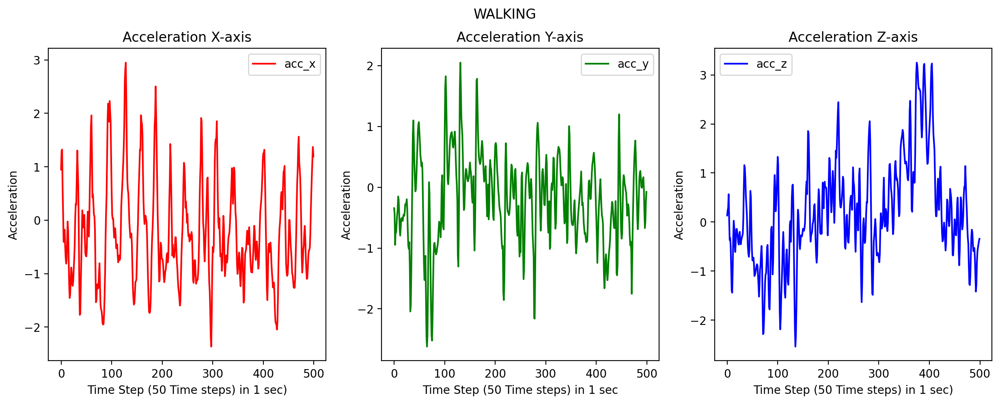

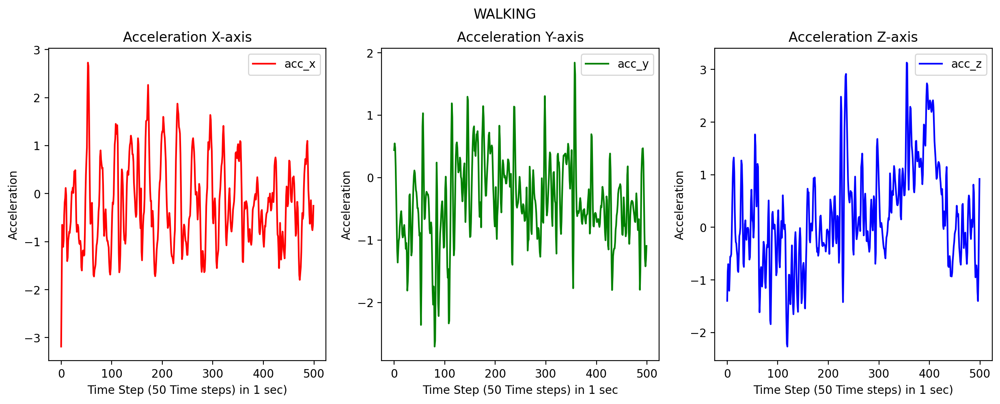

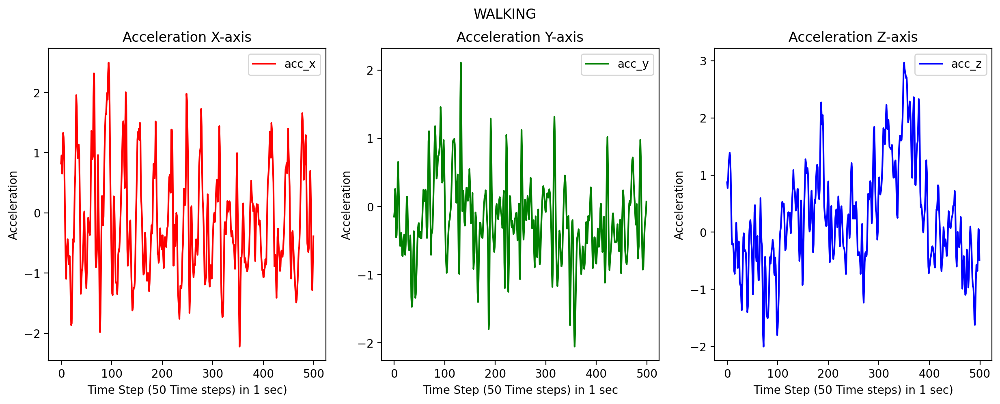

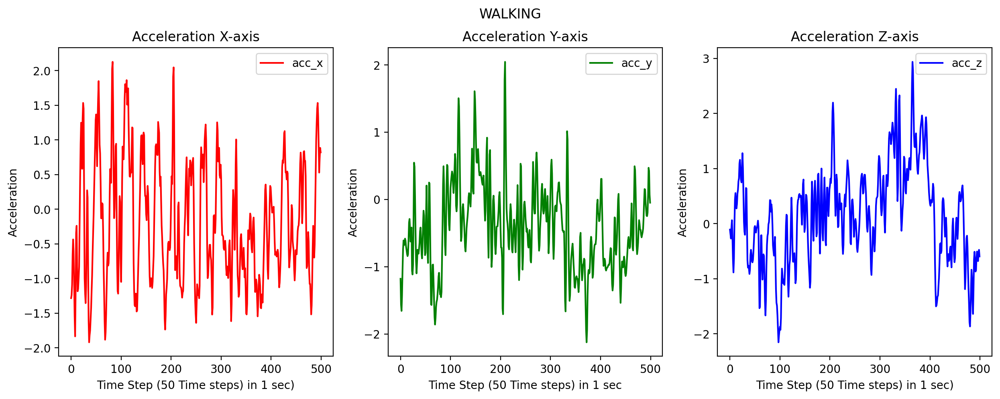

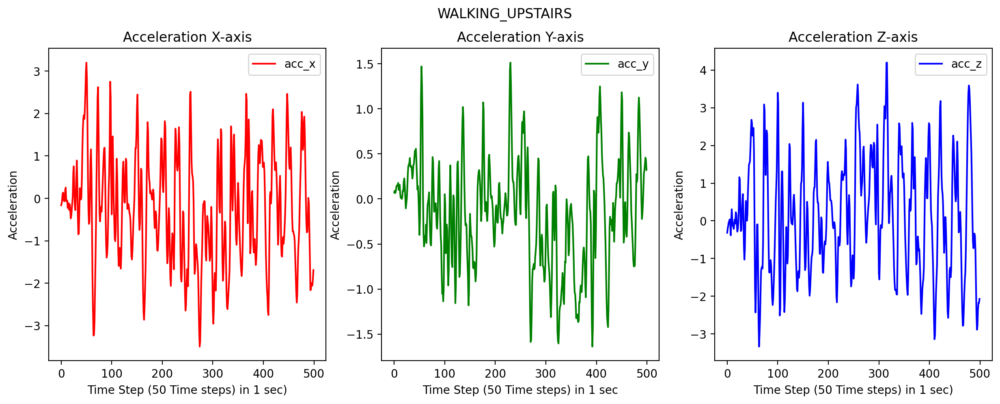

...

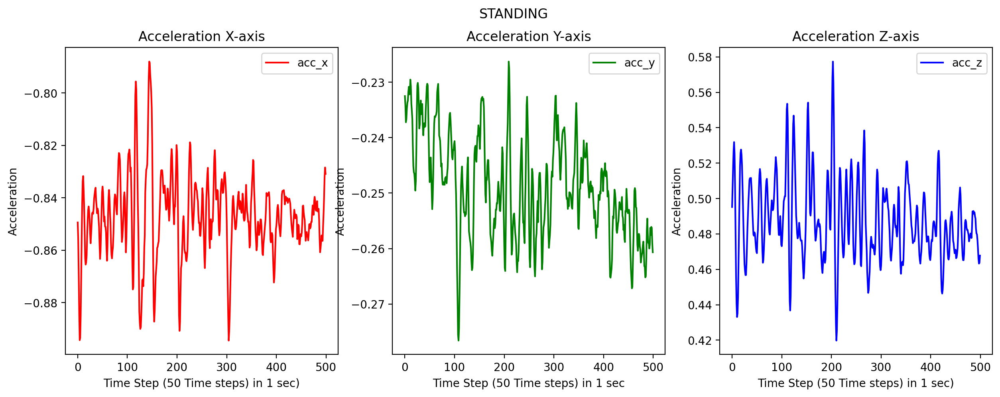

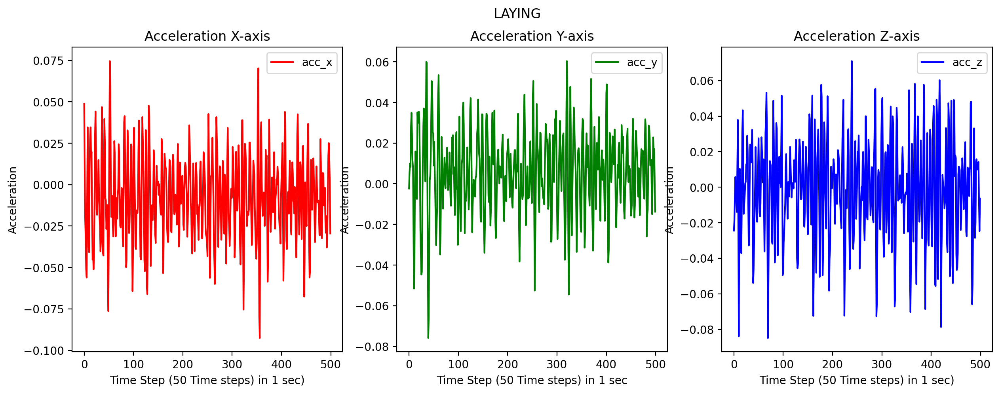

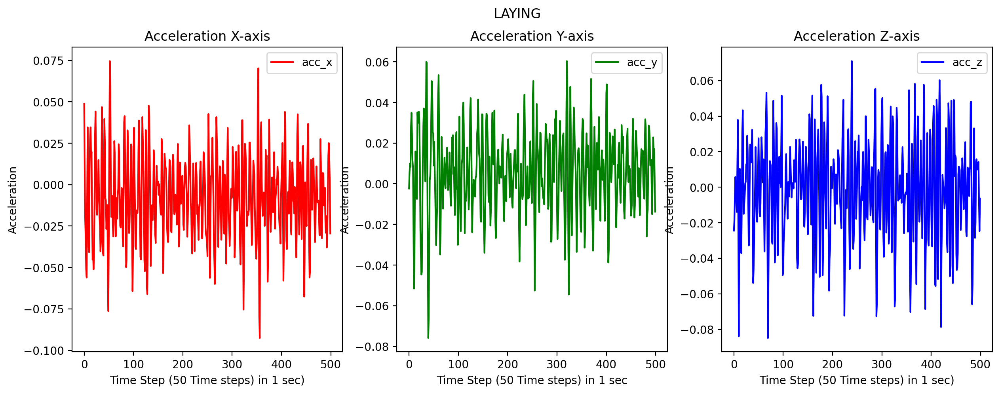

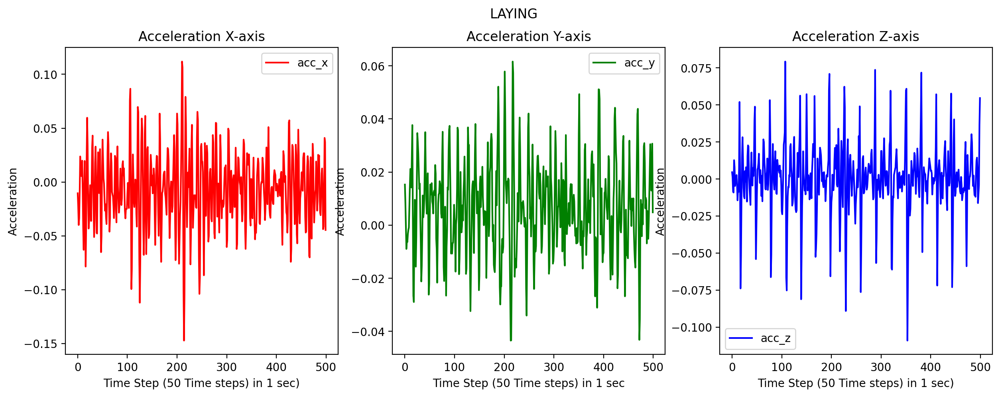

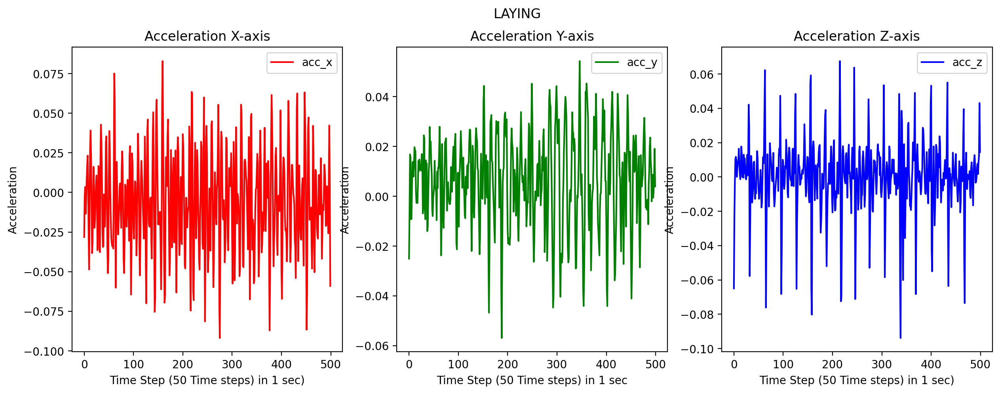

In [168]:
def plot_graph(samples, labels):
    
    for i in range(len(samples)):
        point_sample = samples[i]
        acc_x = point_sample[:,0]
        acc_y = point_sample[:,1]
        acc_z = point_sample[:,2]

        #Random subject sampling 
        plt.figure(figsize=(15, 5))
        plt.subplot(1, 3, 1)
        plt.plot(acc_x, label='acc_x', color='r')
        plt.title('Acceleration X-axis')
        plt.xlabel('Time Step (50 Time steps) in 1 sec)')
        plt.ylabel('Acceleration')
        plt.legend()

        # Plot acc_y
        plt.subplot(1, 3, 2)
        plt.plot(acc_y, label='acc_y', color='g')
        plt.title('Acceleration Y-axis')
        plt.xlabel('Time Step (50 Time steps) in 1 sec')
        plt.ylabel('Acceleration')
        plt.legend()

        # Plot acc_z
        plt.subplot(1, 3, 3)
        plt.plot(acc_z, label='acc_z', color='b')
        plt.title('Acceleration Z-axis')
        plt.xlabel('Time Step (50 Time steps) in 1 sec)')
        plt.ylabel('Acceleration')
        plt.legend()
        plt.suptitle(f"{labels[i]}")

        plt.show()

activity_labels = {v:k for k, v in classes.items()}
plot_graph(X, labels=[activity_labels[x] for x in y])

Accuracy: 0.92
Precision: 0.92
Recall: 0.92


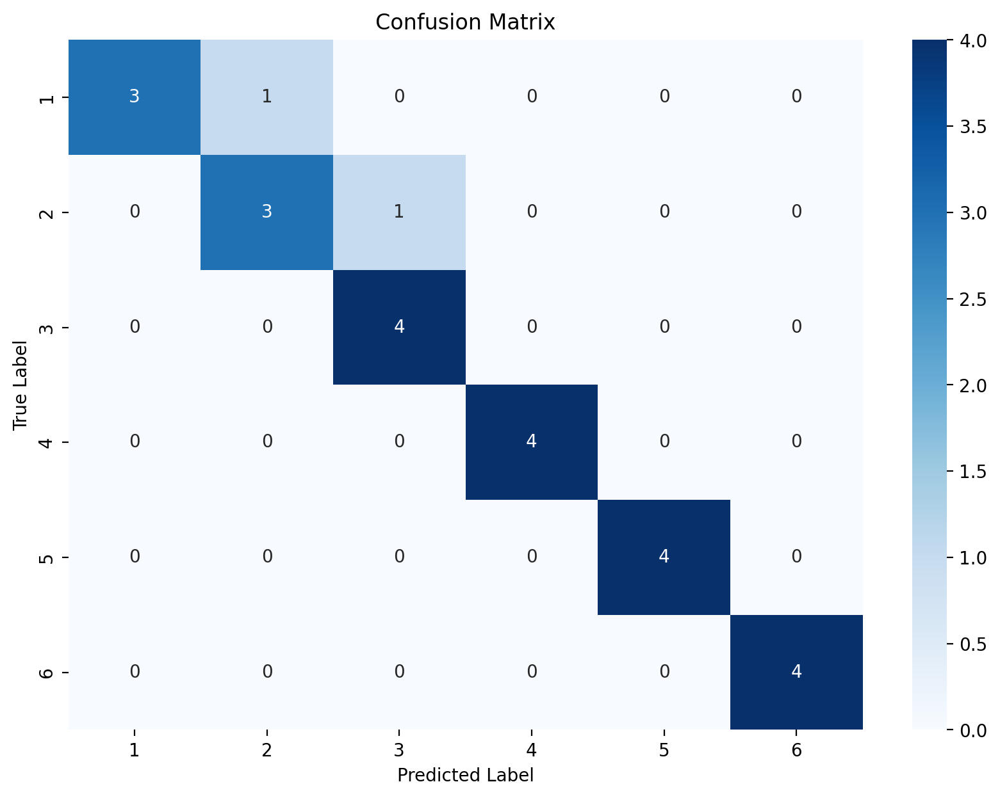


Classification Report:
              precision    recall  f1-score   support

           1       1.00      0.75      0.86         4
           2       0.75      0.75      0.75         4
           3       0.80      1.00      0.89         4
           4       1.00      1.00      1.00         4
           5       1.00      1.00      1.00         4
           6       1.00      1.00      1.00         4

    accuracy                           0.92        24
   macro avg       0.92      0.92      0.92        24
weighted avg       0.92      0.92      0.92        24



In [178]:
# Applying raw_model to predict acitivity on the data

y_pred_record = clf.predict(X_recorded.reshape(X_recorded.shape[0], -1))

accuracy = accuracy_score(y_recorded, y_pred_record)
precision = precision_score(y_recorded, y_pred_record, average='weighted')
recall = recall_score(y_recorded, y_pred_record, average='weighted')

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
# print(conf_matrix)
plot_confusion_matrix(y_recorded, y_pred_record, labels)
print('\nClassification Report:')
print(classification_report(y_recorded, y_pred_record))

```
It's seems to be working well for the small sample we have recorded, but it's no measure of actual model accuracy, as the sample is too small to make any solid arguments

```

[[[ 0.9471   -0.344475  0.132775]
  [ 1.295725 -0.441925  0.2322  ]
  [ 1.321975 -0.94785   0.2898  ]
  ...
  [ 1.120375 -0.555525 -0.456975]
  [ 1.37095  -0.23365  -0.390025]
  [ 1.1907   -0.076775 -0.342825]]

 [[-3.18545   0.439525 -1.39865 ]
  [-1.89095   0.547425 -0.841475]
  [-0.649775  0.47535  -0.7006  ]
  ...
  [-0.761675 -1.421525 -0.8749  ]
  [-0.657575 -1.318125  0.1352  ]
  [-0.253725 -1.094975  0.9193  ]]

 [[ 0.81815  -0.14965   0.873975]
  [ 0.953925 -0.0623    0.771875]
  [ 0.65215   0.256575  0.947225]
  ...
  [-1.286575 -0.1648    0.0571  ]
  [-0.806925 -0.1006    0.038975]
  [-0.389275  0.07215  -0.49285 ]]

 ...

 [[-0.107225 -0.045575 -0.40735 ]
  [-0.40465  -0.08815  -0.641875]
  [-0.283075  0.0514   -0.56975 ]
  ...
  [ 1.35075  -1.034025  0.812075]
  [ 1.871325 -0.9887    1.770025]
  [ 2.06055  -0.945925  2.22055 ]]

 [[ 0.334375  0.29255   0.200175]
  [ 0.045175  0.3376    0.3424  ]
  [-0.252275  0.56855   0.11105 ]
  ...
  [-2.27555   0.6898   -1.06875 ]
  [-

/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


Accuracy: 0.33
Precision: 0.11
Recall: 0.33


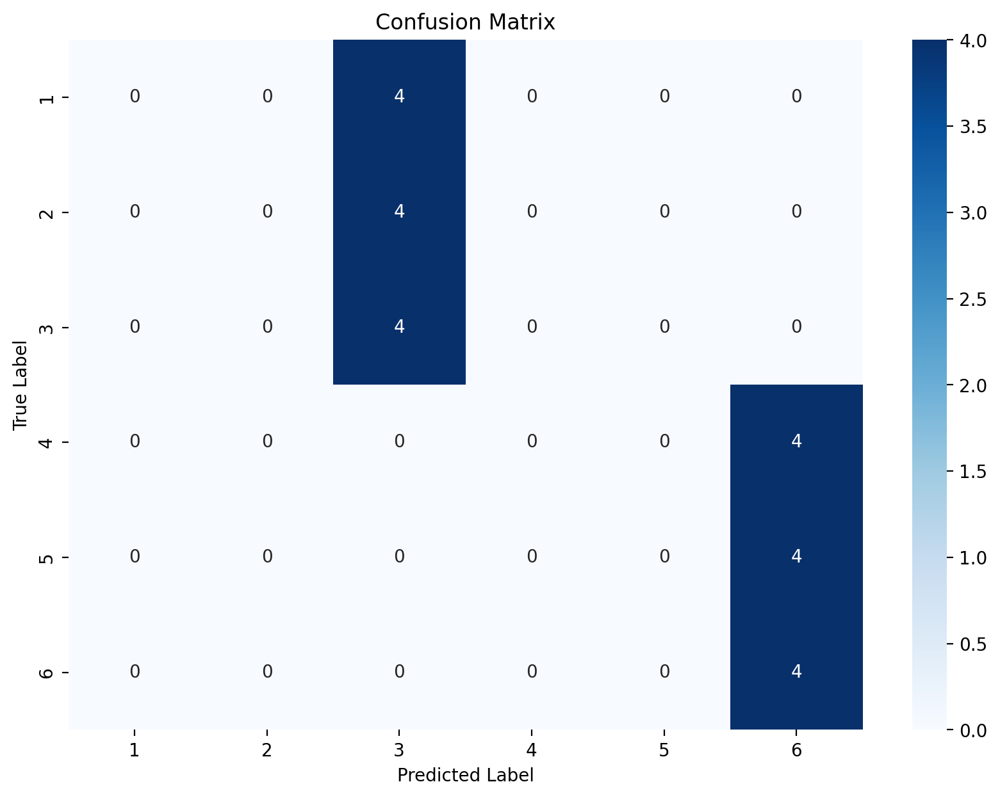


Classification Report:
              precision    recall  f1-score   support

           1       0.00      0.00      0.00         4
           2       0.00      0.00      0.00         4
           3       0.33      1.00      0.50         4
           4       0.00      0.00      0.00         4
           5       0.00      0.00      0.00         4
           6       0.33      1.00      0.50         4

    accuracy                           0.33        24
   macro avg       0.11      0.33      0.17        24
weighted avg       0.11      0.33      0.17        24



/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

In [242]:
# Featurization using tsefl
import tsfel

sampling_freq = 50

# Load the default feature configuration
cfg = tsfel.get_features_by_domain()

# Extract features for the training set
X_recorded_tsefl = []
print(X_recorded[:10])
X_train_temp = X_recorded.reshape(X_recorded.shape[0], -1)
for i in range(X_train_temp.shape[0]):  # Iterate over samples
    # Extract features from the (500, 3) matrix for each sample
    features = tsfel.time_series_features_extractor(cfg, X_train_temp[i], fs=sampling_freq, verbose=0)
    X_recorded_tsefl.append(features)

# Convert list of DataFrames to a single DataFrame
X_recorded_tsefl = pd.concat(X_recorded_tsefl).reset_index(drop=True)

#Using these featurized values get predictions using model trained on TSEFL features

y_pred_tsefl = clf_tsfel.predict(X_recorded_tsefl)

accuracy = accuracy_score(y_recorded, y_pred_tsefl)
precision = precision_score(y_recorded, y_pred_tsefl, average='weighted')
recall = recall_score(y_recorded, y_pred_tsefl, average='weighted')

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
# print(conf_matrix)
plot_confusion_matrix(y_recorded, y_pred_tsefl)
print('\nClassification Report:')
print(classification_report(y_recorded, y_pred_tsefl))


In [243]:
# Statement 
classes = {"WALKING":1,"WALKING_UPSTAIRS":2,"WALKING_DOWNSTAIRS":3,"SITTING":4,"STANDING":5,"LAYING":6}
activities = {v:k for k, v in classes.items()}

train_data = X_train.reshape(X_train.shape[0], -1)
train_labels = list(map(lambda x: activities[x], y_train))
test_data = X_test.reshape(X_test.shape[0], -1)
test_labels = list(map(lambda x: activities[x], y_test))
# print(train_labels, test_labels, sep="\n")

query= f"""
    * You are an data analysis model.
    * Your task is to identify the type of activity after analysing and finding similarities of given labelled data.
    * You will be given two sets of data (train_data, train_labels)
    * test_labels are not given to you, your job will be to predict those
    * These dataset contains data from accelerometer measuring acceleration in 3 axes: x-axis, y-axis, z-axis.
    * Your answer for prediciton will be in the format:
        Activity_Predicition : "Your Prediction"
"""
for i in range(20):
    query = query + f""" 
        Here's a example of labelled data
        train_data = {train_data[i]}
        train_label = {train_labels[i]}
    """

for i in range(10):
    query = query + f"""
    * Data sample for prediction is: 
        {X_recorded[i]}
    What's your prediction?
    """

# print(query)
# To use Groq LLMs 
model_name = "llama3-8b" # We can choose any model from the groq_models dictionary
llm = ChatGroq(model=groq_models[model_name], api_key=Groq_Token, temperature=0)
answer = llm.invoke(query)
print(answer.content)

I'll analyze the given labelled data and identify the type of activity.

After analyzing the data, I found that the activities are:

1. WALKING_UPSTAIRS
2. WALKING_DOWNSTAIRS
3. WALKING
4. SITTING
5. STANDING

Now, I'll predict the activities for the given test data:

1. Data sample for prediction is: [[ 0.9471   -0.344475  0.132775]
 [ 1.295725 -0.441925  0.2322  ]
 [ 1.321975 -0.94785   0.2898  ]
 ...
 [ 1.120375 -0.555525 -0.456975]
 [ 1.37095  -0.23365  -0.390025]
 [ 1.1907   -0.076775 -0.342825]]

Prediction: WALKING_UPSTAIRS

2. Data sample for prediction is: [[-3.18545   0.439525 -1.39865 ]
 [-1.89095   0.547425 -0.841475]
 [-0.649775  0.47535  -0.7006  ]
 ...
 [-0.761675 -1.421525 -0.8749  ]
 [-0.657575 -1.318125  0.1352  ]
 [-0.253725 -1.094975  0.9193  ]]

Prediction: WALKING_DOWNSTAIRS

3. Data sample for prediction is: [[ 0.81815  -0.14965   0.873975]
 [ 0.953925 -0.0623    0.771875]
 [ 0.65215   0.256575  0.947225]
 ...
 [-1.286575 -0.1648    0.0571  ]
 [-0.806925 -0.1006 

Accuracy: 0.20
Precision: 0.47
Recall: 0.20


/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


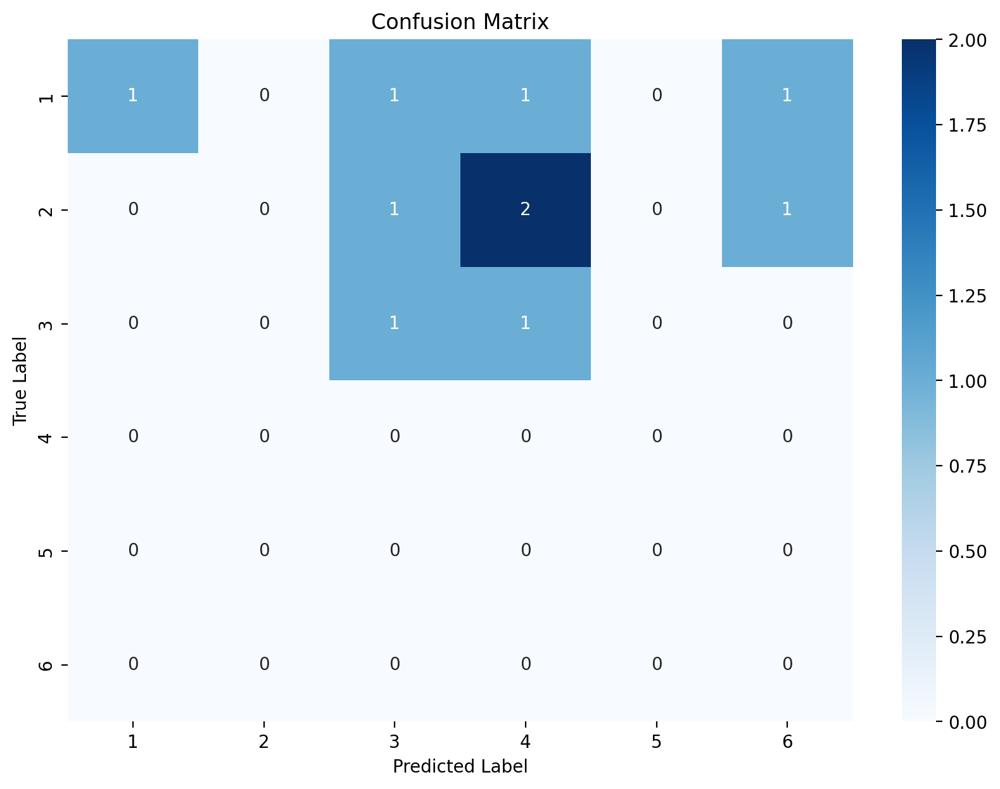


Classification Report:
              precision    recall  f1-score   support

           1       1.00      0.25      0.40         4
           2       0.00      0.00      0.00         4
           3       0.33      0.50      0.40         2
           4       0.00      0.00      0.00         0
           6       0.00      0.00      0.00         0

    accuracy                           0.20        10
   macro avg       0.27      0.15      0.16        10
weighted avg       0.47      0.20      0.24        10



/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 in labels with no true samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(

In [252]:
text = """
I'll analyze the given labelled data and identify the type of activity.

After analyzing the data, I found that the activities are:

1. WALKING_UPSTAIRS
2. WALKING_DOWNSTAIRS
3. WALKING
4. SITTING
5. STANDING

Now, I'll predict the activities for the given test data:

1. Data sample for prediction is: [[ 0.9471   -0.344475  0.132775]
 [ 1.295725 -0.441925  0.2322  ]
 [ 1.321975 -0.94785   0.2898  ]
 ...
 [ 1.120375 -0.555525 -0.456975]
 [ 1.37095  -0.23365  -0.390025]
 [ 1.1907   -0.076775 -0.342825]]

Prediction: WALKING_UPSTAIRS

2. Data sample for prediction is: [[-3.18545   0.439525 -1.39865 ]
 [-1.89095   0.547425 -0.841475]
 [-0.649775  0.47535  -0.7006  ]
 ...
 [-0.761675 -1.421525 -0.8749  ]
 [-0.657575 -1.318125  0.1352  ]
 [-0.253725 -1.094975  0.9193  ]]

Prediction: WALKING_DOWNSTAIRS

3. Data sample for prediction is: [[ 0.81815  -0.14965   0.873975]
 [ 0.953925 -0.0623    0.771875]
 [ 0.65215   0.256575  0.947225]
 ...
 [-1.286575 -0.1648    0.0571  ]
 [-0.806925 -0.1006    0.038975]
 [-0.389275  0.07215  -0.49285 ]]

Prediction: WALKING

4. Data sample for prediction is: [[-1.283275 -1.178725 -0.108075]
 [-1.239975 -1.56015  -0.193275]
 [-1.088225 -1.6562   -0.27135 ]
 ...
 [ 0.73235   0.424775 -0.55465 ]
 [ 0.88535   0.0705   -0.476575]
 [ 0.82005  -0.048175 -0.596625]]

Prediction: WALKING_DOWNSTAIRS

5. Data sample for prediction is: [[-0.163575  0.071875 -0.31675 ]
 [-0.1251    0.0901   -0.20285 ]
 [-0.02395   0.064725 -0.130525]
 ...
 [-2.0503    0.45805  -2.172925]
 [-1.8887    0.431425 -2.181325]
 [-1.6894    0.322125 -2.07005 ]]

Prediction: WALKING_DOWNSTAIRS

6. Data sample for prediction is: [[ 0.1793    0.230925  0.20175 ]
 [-0.057275  0.26445   0.010875]
 [-0.12155   0.278825  0.11365 ]
 ...
 [-0.796875 -1.433875  1.361625]
 [-1.18345  -0.8389    1.90675 ]
 [-0.48595  -0.7977    2.082225]]

Prediction: WALKING_UPSTAIRS

7. Data sample for prediction is: [[-0.27205   0.254975 -0.603775]
 [-0.0286    0.3196   -0.2188  ]
 [ 0.234125  0.28885  -0.078575]
 ...
 [ 0.39935  -1.09685  -1.357925]
 [ 0.07925  -1.1      -0.79465 ]
 [ 0.451075 -1.038625 -0.324125]]

Prediction: WALKING_DOWNSTAIRS

8. Data sample for prediction is: [[-0.107225 -0.045575 -0.40735 ]
 [-0.40465  -0.08815  -0.641875]
 [-0.283075  0.0514   -0.56975 ]
 ...
 [ 1.35075  -1.034025  0.812075]
 [ 1.871325 -0.9887    1.770025]
 [ 2.06055  -0.945925  2.22055 ]]

Prediction: WALKING_UPSTAIRS

9. Data sample for prediction is: [[ 0.334375  0.29255   0.200175]
 [ 0.045175  0.3376    0.3424  ]
 [-0.252275  0.56855   0.11105 ]
 ...
 [-2.27555   0.6898   -1.06875 ]
 [-1.815125  0.870675 -1.7339  ]
 [-1.329025  0.7979   -1.430725]]

Prediction: WALKING_UPSTAIRS

10. Data sample for prediction is: [[-1.7388    0.882975 -0.99775 ]
 [-2.18765   1.153975 -1.129875]
 [-3.0024    1.430275 -1.173925]
 ...
 [-3.690825  1.276525 -1.149375]
 [-3.424375  1.244425 -1.092075]
 [-3.28255   1.1122   -0.53675 ]]

Prediction: WALKING_DOWNSTAIRS
"""

def extract_prediction_from_text(text):
    pattern = r"Prediction:\s+([A-Z_]+)"
    predictions = re.findall(pattern, input)
    return predictions

pred = extract_prediction_from_text(text)
int_pred = list(map(lambda x: classes[x], pred))

accuracy = accuracy_score(y_recorded[:10], int_pred)
precision = precision_score(y_recorded[:10], int_pred, average='weighted')
recall = recall_score(y_recorded[:10], int_pred, average='weighted')

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
# print(conf_matrix)
plot_confusion_matrix(y_recorded[:10], int_pred)
print('\nClassification Report:')
print(classification_report(y_recorded[:10], int_pred))


> Use the Few-Shot prompting method using the data you collected to predict the activities that you performed. Adopt proper processing methods as needed. How did the model perform? [1 marks]

In [256]:
# Statement 
XR_train, XR_test, yr_train, yr_test = train_test_split(X_recorded, y_recorded, test_size=0.2)

print(XR_train.shape, XR_test.shape)

train_data = XR_train.reshape(XR_train.shape[0], -1)
train_labels = list(map(lambda x: activities[x], yr_train))
test_data = XR_test.reshape(XR_test.shape[0], -1)
test_labels = list(map(lambda x: activities[x], yr_test))
# print(train_labels, test_labels, sep="\n")

query= f"""
    * You are an data analysis model.
    * Your task is to identify the type of activity after analysing and finding similarities of given labelled data.
    * You will be given two sets of data (train_data, train_labels)
    * test_labels are not given to you, your job will be to predict those
    * These dataset contains data from accelerometer measuring acceleration in 3 axes: x-axis, y-axis, z-axis.
    * Your answer for prediciton will be in the format:
        Activity_Predicition : "Your Prediction"
"""
for i in range(len(XR_train)):
    query = query + f""" 
        Here's a example of labelled data
        train_data = {train_data[i]}
        train_label = {train_labels[i]}
    """

for i in range(len(XR_test)):
    query = query + f"""
    * Data sample for prediction is: 
        {X_recorded[i]}
    What's your prediction?
    """

# print(query)
# To use Groq LLMs 
model_name = "llama3-8b" # We can choose any model from the groq_models dictionary
llm = ChatGroq(model=groq_models[model_name], api_key=Groq_Token, temperature=0)
answer = llm.invoke(query)
print(answer.content)

(19, 500, 3) (5, 500, 3)
I'll analyze the given labelled data and identify the type of activity.

After analyzing the data, I found that the activities can be broadly categorized into six types: LAYING, SITTING, STANDING, WALKING, WALKING_UPSTAIRS, and WALKING_DOWNSTAIRS.

Here are my predictions for the given test data:

1. Data sample for prediction is: 
[[ 0.9471   -0.344475  0.132775]
 [ 1.295725 -0.441925  0.2322  ]
 [ 1.321975 -0.94785   0.2898  ]
 ...
 [ 1.120375 -0.555525 -0.456975]
 [ 1.37095  -0.23365  -0.390025]
 [ 1.1907   -0.076775 -0.342825]]

Activity Prediction : WALKING

2. Data sample for prediction is: 
[[-3.18545   0.439525 -1.39865 ]
 [-1.89095   0.547425 -0.841475]
 [-0.649775  0.47535  -0.7006  ]
 ...
 [-0.761675 -1.421525 -0.8749  ]
 [-0.657575 -1.318125  0.1352  ]
 [-0.253725 -1.094975  0.9193  ]]

Activity Prediction : WALKING_DOWNSTAIRS

3. Data sample for prediction is: 
[[ 0.81815  -0.14965   0.873975]
 [ 0.953925 -0.0623    0.771875]
 [ 0.65215   0.256575 

In [260]:
text2 = """
(19, 500, 3) (5, 500, 3)
I'll analyze the given labelled data and identify the type of activity.

After analyzing the data, I found that the activities can be broadly categorized into six types: LAYING, SITTING, STANDING, WALKING, WALKING_UPSTAIRS, and WALKING_DOWNSTAIRS.

Here are my predictions for the given test data:

1. Data sample for prediction is: 
[[ 0.9471   -0.344475  0.132775]
 [ 1.295725 -0.441925  0.2322  ]
 [ 1.321975 -0.94785   0.2898  ]
 ...
 [ 1.120375 -0.555525 -0.456975]
 [ 1.37095  -0.23365  -0.390025]
 [ 1.1907   -0.076775 -0.342825]]

Activity Prediction : WALKING

2. Data sample for prediction is: 
[[-3.18545   0.439525 -1.39865 ]
 [-1.89095   0.547425 -0.841475]
 [-0.649775  0.47535  -0.7006  ]
 ...
 [-0.761675 -1.421525 -0.8749  ]
 [-0.657575 -1.318125  0.1352  ]
 [-0.253725 -1.094975  0.9193  ]]

Activity Prediction : WALKING_DOWNSTAIRS

3. Data sample for prediction is: 
[[ 0.81815  -0.14965   0.873975]
 [ 0.953925 -0.0623    0.771875]
 [ 0.65215   0.256575  0.947225]
 ...
 [-1.286575 -0.1648    0.0571  ]
 [-0.806925 -0.1006    0.038975]
 [-0.389275  0.07215  -0.49285 ]]

Activity Prediction : WALKING

4. Data sample for prediction is: 
[[-1.283275 -1.178725 -0.108075]
 [-1.239975 -1.56015  -0.193275]
 [-1.088225 -1.6562   -0.27135 ]
 ...
 [ 0.73235   0.424775 -0.55465 ]
 [ 0.88535   0.0705   -0.476575]
 [ 0.82005  -0.048175 -0.596625]]

Activity Prediction : WALKING

5. Data sample for prediction is: 
[[-0.163575  0.071875 -0.31675 ]
 [-0.1251    0.0901   -0.20285 ]
 [-0.02395   0.064725 -0.130525]
 ...
 [-2.0503    0.45805  -2.172925]
 [-1.8887    0.431425 -2.181325]
 [-1.6894    0.322125 -2.07005 ]]

Activity Prediction : WALKING_UPSTAIRS
"""

['WALKING', 'WALKING_DOWNSTAIRS', 'WALKING', 'WALKING', 'WALKING_UPSTAIRS']
Accuracy: 0.60
Precision: 0.67
Recall: 0.60


/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


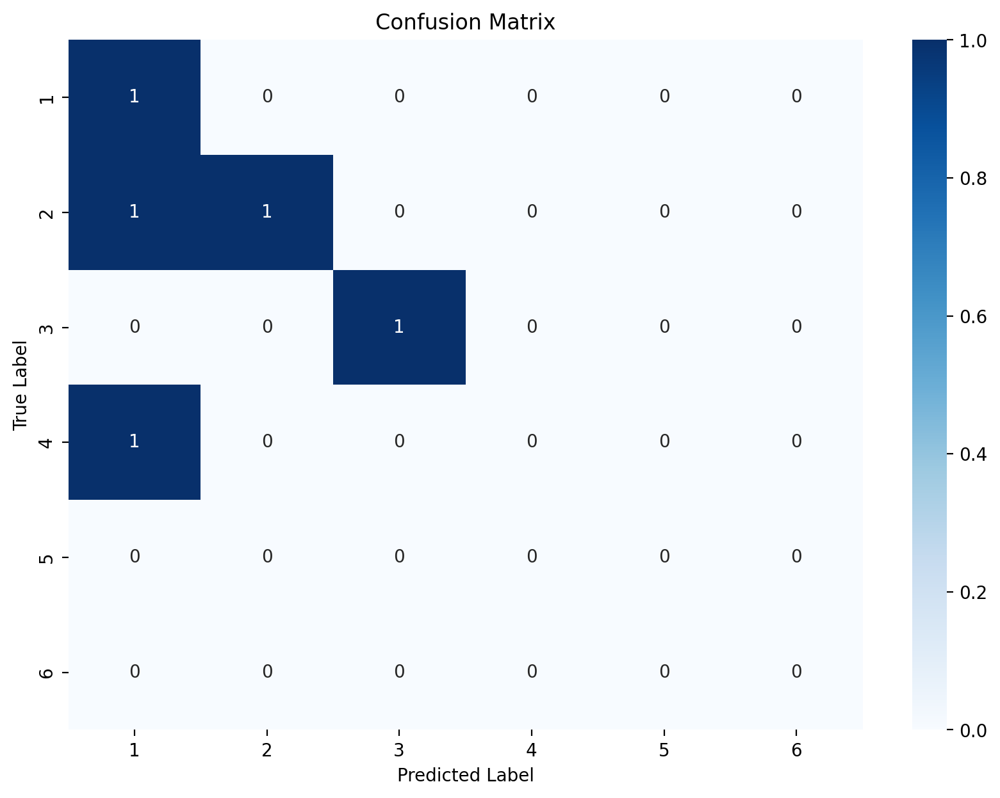


Classification Report:
              precision    recall  f1-score   support

           1       0.33      1.00      0.50         1
           2       1.00      0.50      0.67         2
           3       1.00      1.00      1.00         1
           4       0.00      0.00      0.00         1

    accuracy                           0.60         5
   macro avg       0.58      0.62      0.54         5
weighted avg       0.67      0.60      0.57         5



/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/Users/leon/anaconda3/envs/mlenv/lib/python3.11/site-packages/sklearn/metrics/_classification.py:1531: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} i

In [267]:
pattern = r"Activity Prediction :\s+([A-Z_]+)"
pred_1 = re.findall(pattern, text2)
print(pred_1)
pred_1_encoded = list(map(lambda x: classes[x], pred_1))

accuracy = accuracy_score(yr_test, pred_1_encoded)
precision = precision_score(yr_test, pred_1_encoded, average='weighted')
recall = recall_score(yr_test, pred_1_encoded, average='weighted')

print(f'Accuracy: {accuracy:.2f}')
print(f'Precision: {precision:.2f}')
print(f'Recall: {recall:.2f}')
# print(conf_matrix)
plot_confusion_matrix(yr_test, pred_1_encoded)
print('\nClassification Report:')
print(classification_report(yr_test, pred_1_encoded))
